# Initialization code

## Google Colab

In [0]:
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package google-drive-ocamlfuse.
(Reading database ... 110377 files and directories currently installed.)
Preparing to unpack .../google-drive-ocamlfuse_0.7.1-0ubuntu3~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.1-0ubuntu3~ubuntu18.04.1) ...
Setting up google-drive-ocamlfuse (0.7.1-0ubuntu3~ubuntu18.04.1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=ht

### Sacha

In [0]:
path_collab = "DTU/SG/Project"
import os
os.path.isfile("drive/"+path_collab)
!mkdir drive
!google-drive-ocamlfuse drive
!ls drive/"DTU/SG/Project"

 cartman.jpg		       kenny.jpg   South_Park_Colab.ipynb
'COPIED CODE FROM COLAB.odt'   kyle.jpg    SouthPark.odt
 Data_Set_S1.csv	       kyle.png    stan.jpg
 Data_Set_S1.ods	       Seasons


### Miria


In [0]:
path_collab = "Uni/Social Graphs and Interactions/Project"
import os
os.path.isfile("drive/"+path_collab)
!mkdir drive
!google-drive-ocamlfuse drive
!ls drive/"Uni/Social Graphs and Interactions/Project"

 cartman.jpg		       kenny.jpg   South_Park_Colab.ipynb
'COPIED CODE FROM COLAB.odt'   kyle.jpg    SouthPark.odt
 Data_Set_S1.csv	       kyle.png    stan.jpg
 Data_Set_S1.ods	       Seasons	  'Website text.odt'


### Tom

In [0]:
path_collab = "Denmark/SG/Project"
import os
os.path.isfile("drive/"+path_collab)
!mkdir drive
!google-drive-ocamlfuse drive
!ls drive/"Denmark/SG/Project"

mkdir: cannot create directory ‘drive’: File exists
fuse: mountpoint is not empty
fuse: if you are sure this is safe, use the 'nonempty' mount option
ls: cannot access 'drive/Denmark/SG/Project': No such file or directory


## Import

In [0]:
# pip install to comment

!pip install wikia
!pip install fa2
!pip install python-louvain

In [0]:
# all import of the project

import wikia
import urllib.request as url
import urllib.parse
import pandas as pd
import networkx as nx
import json
import re 
import matplotlib.pyplot as plt
import community
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from fa2 import ForceAtlas2
from scipy import stats

# Motivation

We decided to work on a South Park dataset built from the Fandom website [southpark.wikia.com](https://southpark.wikia.com). We did this as we were all familiar with the show, and thought it would be fun to take a deeper look into the language of the show. All Fandom sites share an API that makes it easy to retrieve pages in JSON format, thus allowing us to get all the data we needed from the character pages. Much to our luck, the South Park Fandom wikia has the scripts for each episode in a somewhat unified format, making it easy to analyze the scripts themselves. We also found, that it was easy to determine which characters were actually saying each line from the script, allowing us to individually analyze each character. Due to the ease of working with this dataset, and our interest in working with the South Park show, we chose to work with the Fandom wikia API. 

Our end goal was to determine the sentiment over time, and see how the language of South Park had evloved though the ages. South Park has always been a controversial show, and reflected the current state of society. Due to this, we wanted to put our research on language analysis in the forefront of our website. Looking at the show as a separate entity from our society is also important, however, and as such we wanted to see if we could find some connection between the characters. 

# Basic stats

Due to working with the Fandom Wikia API, the need for data cleaning and pre-processing was kept to a minimum. We could easily extract the characters from a centralized '*Characters*' page, and all the names of the episodes were readily available and divided into seasons from a centralized '*List of episodes*' page. 

For the characters, extracting the links and finding communities was simple enough, and could be done much in the same way as we had done back when we worked with the Wikipedia dataset. 

## Get all the name of the characters

First we retrieve all the names of the characters from the '*Characters*' page

In [0]:
baseurl = "http://southpark.wikia.com/api.php"
action = "query"
prop = "revisions"
titles = "The_Boys"
rvprop = "content"
dformat = "json"

# get data
titles = "Portal:Characters"
query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+titles+"&rvprop="+rvprop+"&format="+dformat
list_all_characters = url.urlopen(query)


# json stuff
characters = json.loads(list_all_characters.read())
cstring = characters["query"]["pages"]["3590"]["revisions"][0]["*"]
list_characters = re.findall("\[\[(.*?)\]\]",cstring)

# delete the first 6 "characters" in the top of the page
del list_characters[0:6]

# delete the last 4 elements wich are anotation
del list_characters[-4:]

df_characters = pd.DataFrame(list_characters,columns=["Name"])

Here we simply need to delete the first six characters in the top of the page, and the last four. This is due to some meta-character categories that are present on the webpage, represented as if they were regular characters. This is also due to the four main boys appearing both in the top of the webpage, and in the full list of characters ([see here](http://southpark.wikia.com/wiki/Portal:Characters#All%20Characters))

In [0]:
print("Amount of characters:",len(list_characters))

Amount of characters: 1043


Later on we will also retrieve all the scripts from the episodes, which resulted in **6.25 MB** of raw text data.

# Analysis 1 - Network visualisation and community detection

First we build a NetworkX network between all the characters in the show. This is interesting, since it allows us to get insight into the relations between the characters, and get a better understanding of the characters in a human sense. Were these regular kids, we could find out whot their friends are, and who they do not associate with. This all leads to *community detection*, which is the interesting part of the visualisation. Through community detection, we can see which groups of characters interact more. This is done by finding connected subgraphs through the Louvain algorithm, which partitions the nodes in a network in accordance to the links between nodes. 

In order to do community detection, we must first set up the network.

## Create a list between characters

In creating the network of characters, we found that certain groups of characters also appeared as a group. This most notably included a character named '*The Boys*', which consisted of our four main characters. Also notably was the character '*The Fourth Grade*'. In order to create the most accurate network, and find the right communities, we decided to split these two groups into the characters they consisted of. This meant that whenever a page referenced e.g. '*The Boys*', we would simply create a link to each of the four main characters instead.

In [0]:
the_boys = ["Eric Cartman","Kenny McCormick","Stan Marsh", "Kyle Broflovski"]
the_fourth_grade = ["Annie Knitts", "Bebe Stevens","Butters Stotch", "Clyde Donovan", "Craig Tucker", "Eric Cartman", "Jimmy Valmer",
                   "Kenny McCormick", "Kyle Broflovski", "Red", "Stan Marsh", "Timmy Burch", "Token Black", "Wendy Testaburger"]

In [0]:
G=nx.DiGraph()
names_set = set(df_characters.Name)

for i in range(len(df_characters)):
  
    #we get all the name of the characters
    name = df_characters['Name'].iloc[i]
    name_parse = urllib.parse.quote(name)
    
    if name == "The 4th Grade" or name == "The Boys":
      continue
    
    #change of the query
    query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+name_parse+"&rvprop="+rvprop+"&format="+dformat
    name_url = url.urlopen(query)
  
    # json stuff
    page_character = json.loads(name_url.read())
    page_character
    
    # take all the character present in the page of the one we are looking at
    
    txt = str(page_character["query"]["pages"])
    strings = re.findall(r'\[\[(.*?)\]\]', txt)
    intersection_set = set(strings).intersection(set(names_set))
    intersection_list = list(intersection_set)
    
    for elem in intersection_list:
      if elem == "The Boys":
        intersection_list.remove(elem)
        intersection_list.extend(the_boys)
      elif elem == "The 4th Grade":
        intersection_list.remove(elem)
        intersection_list.extend(the_fourth_grade)
    
    # Creation of the graph
    for i in range(len(intersection_list)):
        G.add_edge(name,intersection_list[i])
    
    

First we draw the raw network, without any alterations

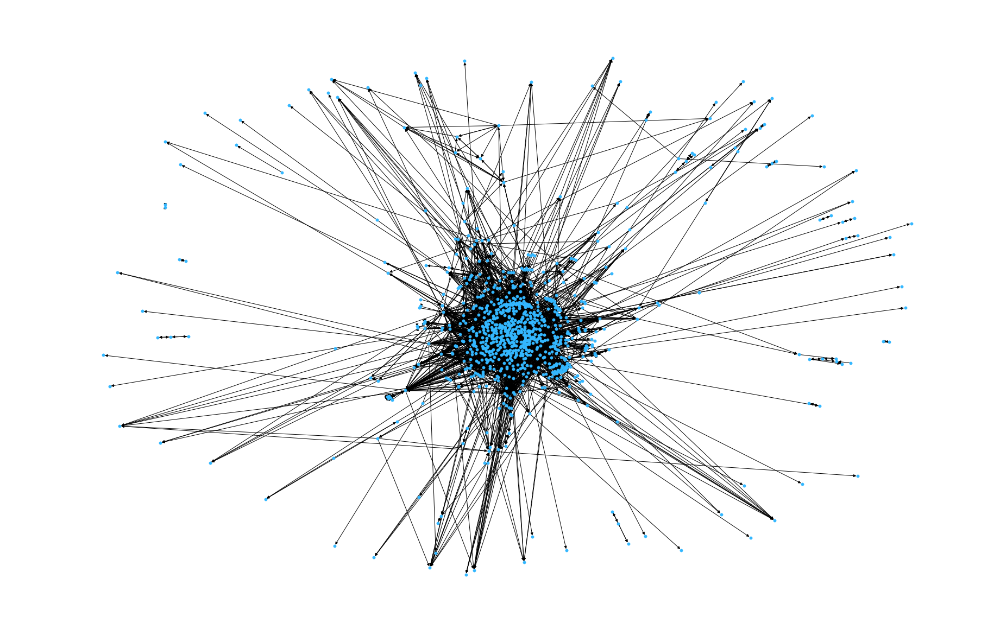

In [0]:
nx.draw(G, with_labels=False, font_weight='bold', node_size = 30, node_color = "#33B7FF",font_size = 3)   

Here we simply colour the nodes corresponding to the four main characters, and give them unique colours from the rest of the cast. As these four are the most prominent (and most interesting) characters, we wanted a quick and easy way for our readers to distinguish them from the rest of the cast, and to immediately know the importance of each of the boys in the network

In [0]:
color_map = []
for node in G.nodes:
  if node == "Eric Cartman":
    color_map.append("red")
  elif node == "Stan Marsh":
    color_map.append("blue")
  elif node == "Kyle Broflovski":
    color_map.append("green")
  elif node == "Kenny McCormick":
    color_map.append("orange")
  else:
    color_map.append("yellow")


As this is quite messy, we apply the Force Atlas algorithm, opting also to work with an undirected version of the graph consisting only of the largest connected-component subgraph.

100%|██████████| 2500/2500 [00:29<00:00, 84.22it/s]


BarnesHut Approximation  took  9.13  seconds
Repulsion forces  took  18.31  seconds
Gravitational forces  took  0.15  seconds
Attraction forces  took  0.54  seconds
AdjustSpeedAndApplyForces step  took  0.66  seconds


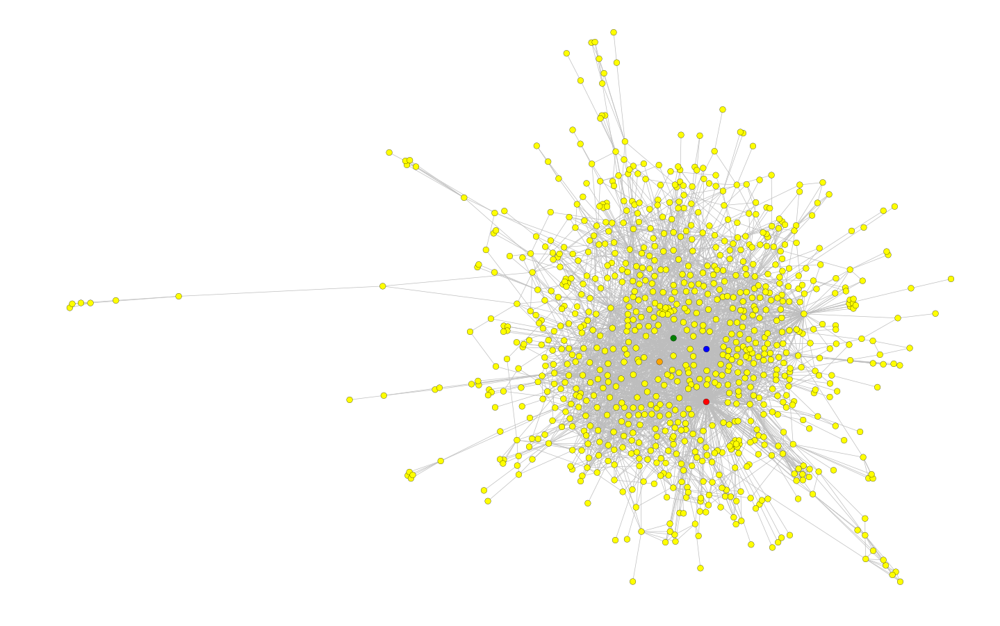

In [0]:
import matplotlib.pyplot as plt
Gc = max(nx.connected_component_subgraphs(G.to_undirected()), key=len)

forceatlas2 = ForceAtlas2(
                          # Behavior alternatives
                          outboundAttractionDistribution=False,  # Dissuade hubs
                          linLogMode=False,  # NOT IMPLEMENTED
                          adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                          edgeWeightInfluence=2,

                          # Performance
                          jitterTolerance=0.9,  # Tolerance
                          barnesHutOptimize=True,
                          barnesHutTheta=1.2,
                          multiThreaded=False,  # NOT IMPLEMENTED

                          # Tuning
                          scalingRatio=4.0,
                          strongGravityMode=False,
                          gravity=2.0,

                          # Log
                          verbose=True)

# change the area of the plot
plt.rcParams["figure.figsize"] = [25,16]

# apply forceatlas and draw
positions = forceatlas2.forceatlas2_networkx_layout(Gc, pos=None, iterations=2500)
nx.draw_networkx(Gc, positions, width=0.7,edge_color = "#bdbdbd", cmap=plt.get_cmap('jet'), node_size = 75, with_labels=False, node_color = color_map)

# set node outlines to black
ax = plt.gca() # to get the current axis
ax.collections[0].set_edgecolor("#000000")  

#removes the axis and brackgound grid from the plot
plt.grid('off')
plt.axis('off')
plt.show()


This is a much nicer graph to look at, and easily shows us each of the boys in the network. In order to see the importance of the characters however, we choose to plot the network altered network again, but this time the size of the nodes corresponds to the betweenness centrality of the node

100%|██████████| 3000/3000 [00:34<00:00, 87.49it/s]


BarnesHut Approximation  took  11.03  seconds
Repulsion forces  took  20.73  seconds
Gravitational forces  took  0.17  seconds
Attraction forces  took  0.54  seconds
AdjustSpeedAndApplyForces step  took  0.78  seconds


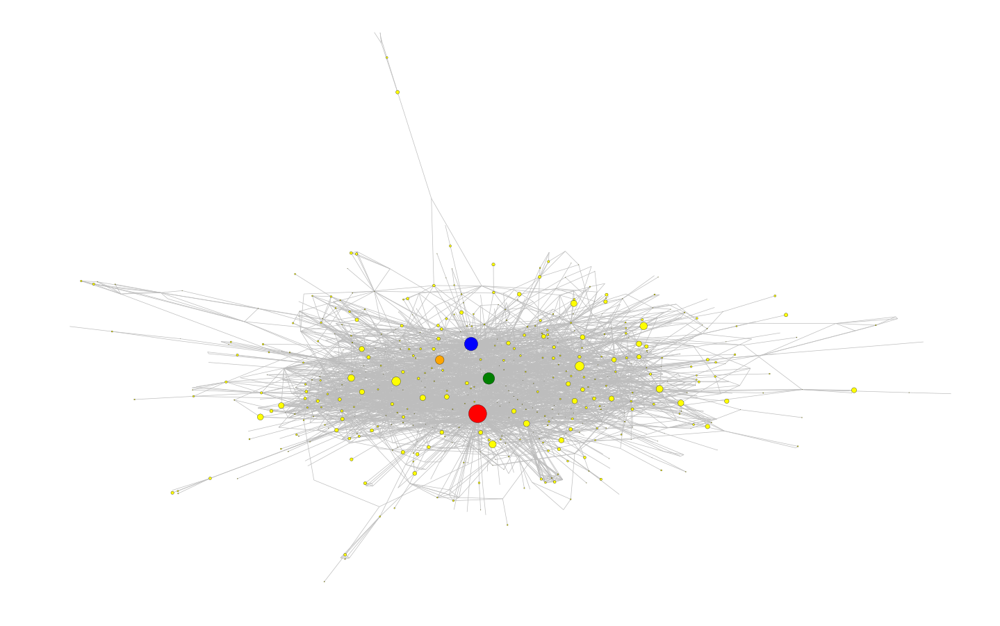

In [0]:
dict_between = dict(nx.betweenness_centrality(G))
positions = forceatlas2.forceatlas2_networkx_layout(Gc, pos=None, iterations=3000)
nx.draw_networkx(Gc, positions, width=0.7,edge_color = "#bdbdbd", cmap=plt.get_cmap('jet'), node_size = [v * 4000 for v in list(dict_between.values())], with_labels=False, font_size=5, node_color = color_map)

ax = plt.gca() 
ax.collections[0].set_edgecolor("#000000")

plt.grid('off')
plt.axis('off')
plt.show()


As we can see, Cartman (red) is the most central character in the show, followed by Stan (blue), Kyle (green) who are quite similar in centrality. Unsurprisingly, the least central main character is Kenny (orange). This is due to Kenny being mostly a gag character, as the audience can only barely hear anything he says due to his muffled speech. This means that the amount of episodes where Kenny is a central character is quite limited in comparison to the other main characters. 

## Community detection


Now we are finally ready to do community detection.

First we compute the best partition, and divide the nodes into communities

In [0]:
G2 = G.to_undirected()

#first compute the best partition
partition = community.best_partition(G2)
# THE NUMBER IS THE COMMUNITY
print ("The amount of communities is " + str(max(partition.values())+1))
# PLOT THE NETWORK WHERE EACH COMMUNITY HAS IT'S OWN COLOUR
print(partition["Eric Cartman"],partition["Stan Marsh"],partition["Kyle Broflovski"],partition["Kenny McCormick"], partition["Butters Stotch"])

The amount of communities is 26
9 4 2 7 10


Here we can see there is quite a large amount of communities. This could be due to the many one-off characters (characters that only appear once), that are not very connected to the network. These outlier nodes will be partitioned into their own community, and thus bloat the number of communities. 

More surprisingly, however, is that not all the main characters appear in the same community. Stan Marsh and Kyle Broflovski appear in the same community, which makes sense since these two characters are best friends in the show. Kenny McCormick and Butters Stotch being in the same community is more surprising, however, since these two characters interact more rarely. However, Butters Stotch took over the place of Kenny McCormick in quite a number of episodes, and as such has a strong connection with the main characters.


Next we draw the network, colourized in accordance to the networks

In [0]:
# Get values to colormap in grapgh
G2C = max(nx.connected_component_subgraphs(G2.to_undirected()), key=len)
values = [partition.get(node) for node in G2C.nodes()]


100%|██████████| 5000/5000 [00:55<00:00, 90.80it/s]


BarnesHut Approximation  took  15.38  seconds
Repulsion forces  took  35.52  seconds
Gravitational forces  took  0.27  seconds
Attraction forces  took  0.88  seconds
AdjustSpeedAndApplyForces step  took  1.21  seconds


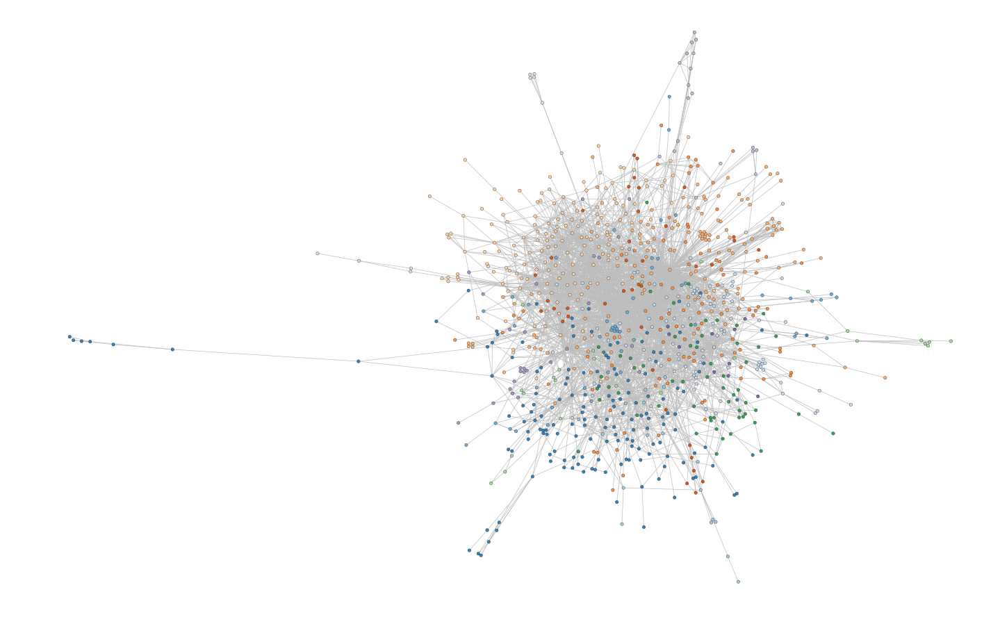

In [0]:
positions = forceatlas2.forceatlas2_networkx_layout(G2C, pos=None, iterations=5000)
nx.draw_networkx(G2C, positions, width=0.7,edge_color = "#bdbdbd", cmap=plt.cm.tab20c, node_size = 20, with_labels=False, node_color = values)


ax = plt.gca() 
ax.collections[0].set_edgecolor("#000000")

plt.grid('off')
plt.axis('off')
plt.show()


### Conclusion

In conclusion, the communities of the characters are somewhat well defined, as the nodes in the network are split up reasonably in accordance to their community (colour). The four main characters do not all belong to the same community, which is surprising, but Eric Cartman often has his own episodes and characters he interacts with, making him a prime candidate for being in a different community. Stan Marsh and Kyle Broflovksi are in the same community, which makes sense given the two characters are best friends in the show and thus often interact with the same people. Kenny McCormick and a secondary character Butters Stotch are in the same community though these two do not have any immediate connection. They have both acted as the '*Fouth member*' of '*The Boys*' however, giving them both a strong connection to the main cast.

# Analysis 2 - Stats about the network

In order to find the most central characters in the show, we will perform analysis on the network in accordance to the clustering, density and more importantly, the degrees of notes and their centrality. These all describe the nodes in different ways, but together they give an impression of the network as a whole, and which nodes are most important to the structure.

## Basic Stats
First we will calculate some basic stats about the network. This includes the number of nodes, edges, density of the network, as well as the clustering

In [0]:
print("Number of nodes: " + str(len(list(G.nodes))))
print("Number of edges: " + str(len(list(G.edges))))
print("Density: " + str(nx.density(G)))

Number of nodes: 908
Number of edges: 3931
Density: 0.004773203036587676


The low density is an indicator of a singular node being connected to only a few other nodes in the network. This follows naturally from the same point made in Community detection, where the characters that only appear once in the show have only a few connections to other nodes in the network. This makes for a low-density network, despite the high amount of nodes and edges.

In [0]:
# AVverage clustering coefficient 
print(nx.average_clustering(G))

0.2937549432521388


Despite the low density, we still see a relatively high clustering coefficient for the network. Many nodes connect to the Boys (due to them being the main characters), and the Boys connect amongst themselves. This makes the clustering of the network much higher than the density, Also, as seen in the visualised network above, many characters appear in a small, interconnected group of characters. These might be all of the characters that appear together in a single episode and never appear again, making each of the characters strongly connected to the others and thus furthering their clustering coefficient.

Next we will look into the degrees of the nodes

In [0]:
# Highest degree
dict_deg_characters = dict(G.degree(G.nodes))
df_deg_characters = pd.DataFrame.from_dict(dict_deg_characters, orient='index')
df_deg_characters.columns = ['Degree']
print("Highest degree")
print(df_deg_characters.sort_values(by=['Degree'], ascending=False).head(5))
print("\n")
print("Lowest degree")
print(df_deg_characters.sort_values(by=['Degree'], ascending=False).tail(5))
#median 
print("\n")
print("Median: ", df_deg_characters['Degree'].median())
#Average 
print("\n")
print("Average: ", df_deg_characters['Degree'].mean())
#Mode 
print("\n")
print("Mode: ", df_deg_characters['Degree'].mode())

Highest degree
                 Degree
Eric Cartman        330
Stan Marsh          223
Kyle Broflovski     184
Kenny McCormick     143
Butters Stotch      115


Lowest degree
                                        Degree
Queen Spider                                 1
Kublai Khan                                  1
Michael Jackson Hologram                     1
Dr. Pal                                      1
The Knights of Standards and Practices       1


Median:  4.0


Average:  8.658590308370044


Mode:  0    2
dtype: int64


As expected, the Boys have the highest degrees in the network, with Eric Cartman having a significantly higher amount of links than the others. This ranking of degrees, incidentally, also reflects the popularity of the characters, and how often they are a central character in an episode. Eric Cartman, being the most popular, is utilized most often and as such connects to the most people.

On the lowest degree, we can see that the characters are all rather insignificant, appearing in only a single episode, if not only in a single scene. The only exception to this is The Coon, who is the alter ego of Eric Cartman. As such, his low degree could be explained by links simply pointing to Eric Cartman instead of The Coon.


To get an overview of the network as a whole, we plot the degrees of all the nodes in the network.

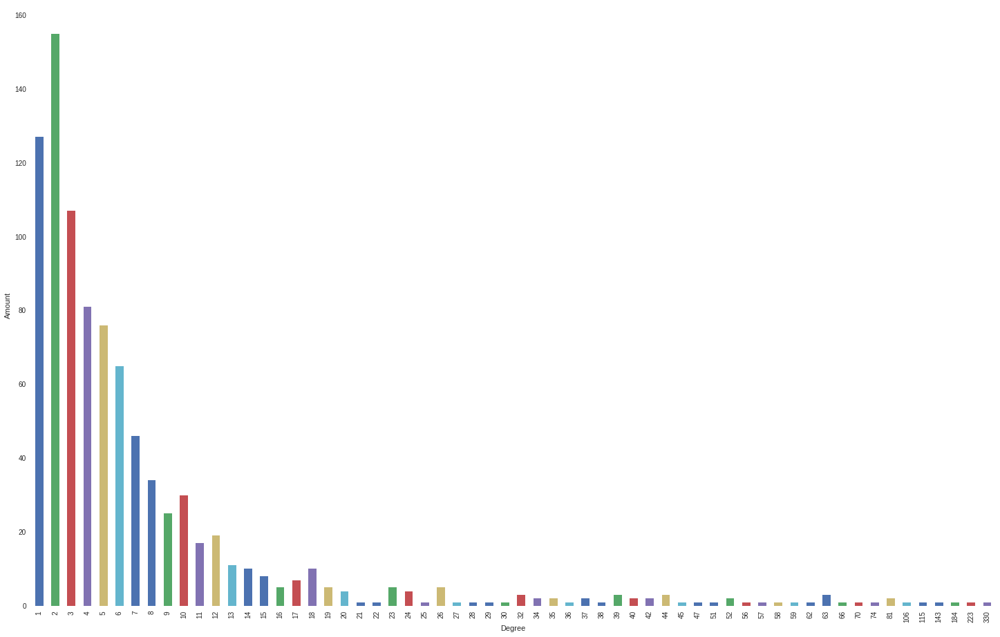

In [0]:
df_deg_characters.groupby(['Degree']).size().plot('bar')
plt.rcParams['axes.facecolor'] = 'white'
plt.ylabel("Amount")
plt.show()

As we can see, most of the characters have under 10 links, which means most characters in the show only interact with a few characters.

As we are working with a directed network, we will now look at the in and out degrees of the nodes

In [0]:
#In Degree
dict_indeg_characters = dict(G.in_degree(G.nodes))
df_indeg_characters = pd.DataFrame.from_dict(dict_indeg_characters, orient='index')
df_indeg_characters.columns = ['In Degree']
print("Highest degree")
print(df_indeg_characters.sort_values(by=['In Degree'], ascending=False).head(5))
print("\n")
print("Lowest degree")
print(df_indeg_characters.sort_values(by=['In Degree'], ascending=False).tail(5))
#median 
print("\n")
print("Median: ", df_indeg_characters['In Degree'].median())
#Average 
print("\n")
print("Average: ", df_indeg_characters['In Degree'].mean())
#Mode 
print("\n")
print("Mode: ", df_indeg_characters['In Degree'].mode())

Highest degree
                 In Degree
Eric Cartman           244
Stan Marsh             178
Kyle Broflovski        148
Kenny McCormick        106
Butters Stotch          78


Lowest degree
                     In Degree
Master P                     0
Matt Hasselbeck              0
Matt (Nelly's Dad)           0
Charlotte's Brother          0
911 Truth Webmaster          0


Median:  2.0


Average:  4.329295154185022


Mode:  0    0
dtype: int64


The results here are the same as when we looked at the degrees of the nodes without taking directed edges into consideration. The average and mean in-degrees of the network are also both quite low, corresponding well with the conclusion earlier - that most characters only interact with a low number of other characters.

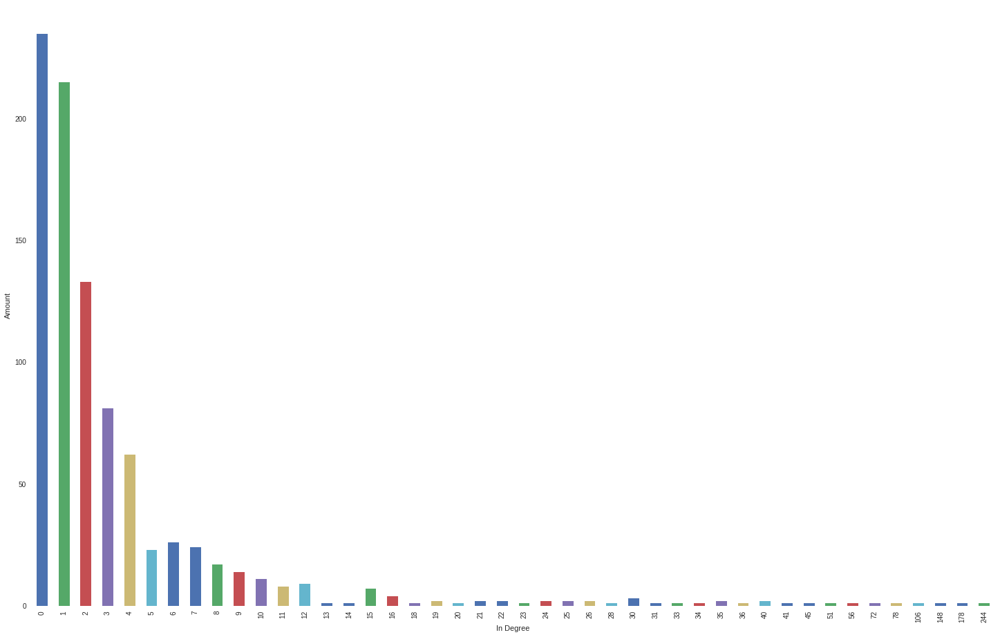

In [0]:
df_indeg_characters.groupby(['In Degree']).size().plot('bar')
plt.rcParams['axes.facecolor'] = 'white'
plt.ylabel("Amount")
plt.show()

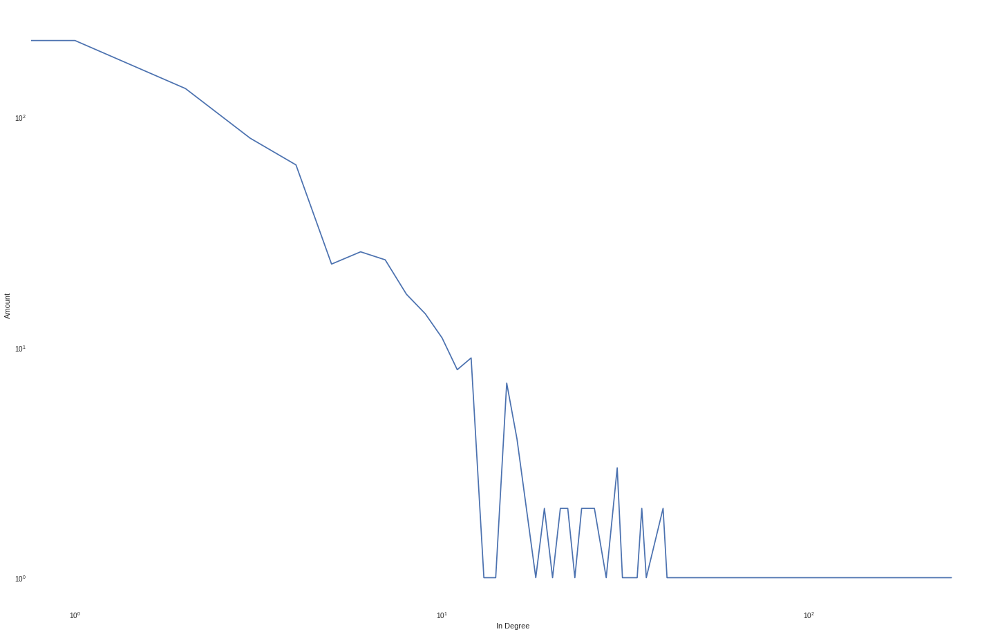

In [0]:
# Plot the probability distribution of in-degrees, loglog scale.
df_indeg_characters.groupby(['In Degree']).size().plot(loglog=True)
plt.rcParams['axes.facecolor'] = 'white'
plt.ylabel("Amount")
plt.show()

Next we will do the same but for out-degrees

In [0]:
#Out Degree
dict_outdeg_characters = dict(G.out_degree(G.nodes))
df_outdeg_characters = pd.DataFrame.from_dict(dict_outdeg_characters, orient='index')
df_outdeg_characters.columns = ['Out Degree']
print("Highest Out degree")
print(df_outdeg_characters.sort_values(by=['Out Degree'], ascending=False).head(5))
print("\n")
print("Lowest Out degree")
print(df_outdeg_characters.sort_values(by=['Out Degree'], ascending=False).tail(5))
#median 
print("\n")
print("Median: ", df_outdeg_characters['Out Degree'].median())
#Average 
print("\n")
print("Average: ", df_outdeg_characters['Out Degree'].mean())
#Mode 
print("\n")
print("Mode: ", df_outdeg_characters['Out Degree'].mode())


Highest Out degree
                  Out Degree
Eric Cartman              86
Stan Marsh                45
Herbert Garrison          40
Butters Stotch            37
Kenny McCormick           37


Lowest Out degree
                  Out Degree
Johnnie Cochran            0
Metallica                  0
Trent Boyett               0
Emperor Hirohito           0
Sarah Peterson             0


Median:  2.0


Average:  4.329295154185022


Mode:  0    1
dtype: int64


Here we see a different set of characters in the top 5. Herbert Garrison, the teacher of the class the Boys attend, takes the number three spot, with Kyle Broflovsky not appearing anywhere on the list. 

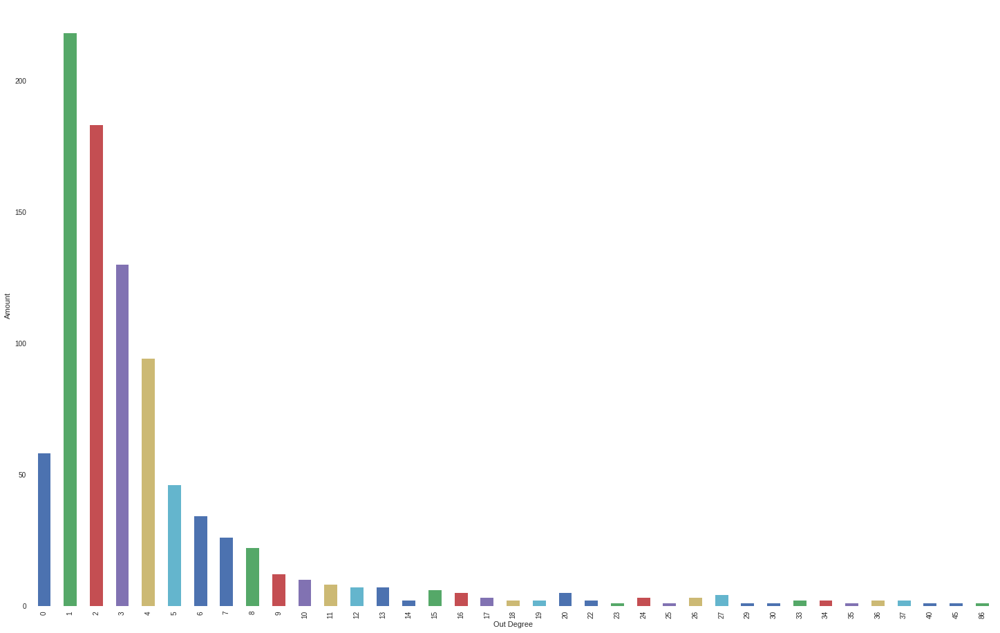

In [0]:
df_outdeg_characters.groupby(['Out Degree']).size().plot('bar')
plt.rcParams['axes.facecolor'] = 'white'
plt.ylabel("Amount")
plt.show()

Next we will plot the out-degree versus in-degree for the nodes.

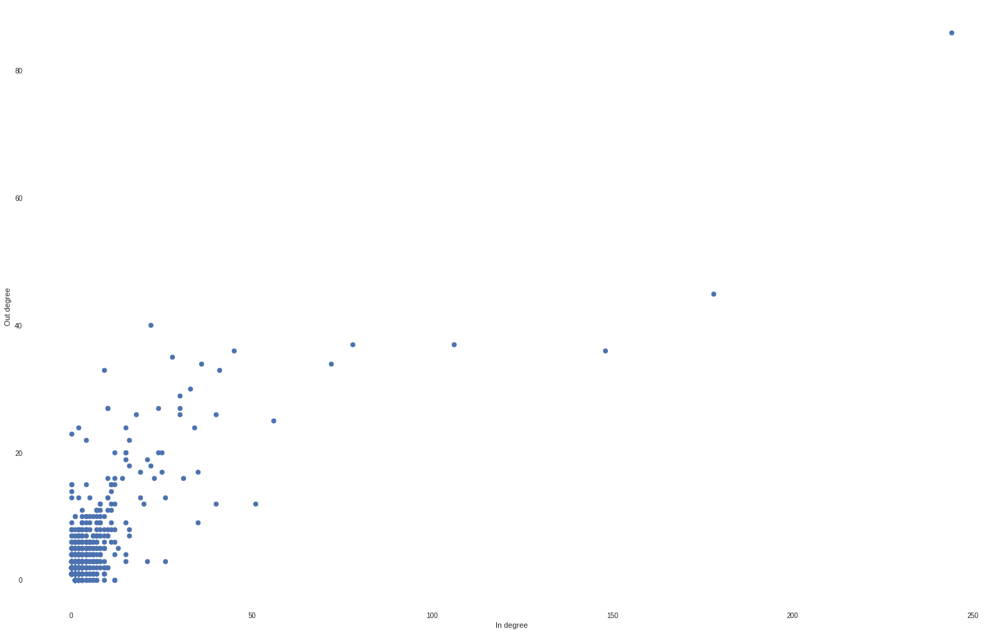

In [0]:
plt.scatter(df_indeg_characters['In Degree'],df_outdeg_characters['Out Degree'])
plt.xlabel("In degree")
plt.ylabel("Out degree")
plt.rcParams['axes.facecolor'] = 'white'
plt.show()

From this it is apparent that nodes with a low in-degree also tend to have a low out-degree, but that few nodes also have a relatively high out-degree compared to other nodes with the same in-degree.

Now we will take a look at the Eigenvector centrality of the network. Eigenvector centrality describes nodes in relation to the nodes they are connected to. A node with high Eigenvector centrality is a highly connected node connected to other highly connected nodes. This will as such give us an insight into which characters are connected to other highly connected characters. 

In [0]:
# EIGENVECTOR CENTRALITY IN
dict_inEigCen_characters = dict(nx.eigenvector_centrality(G))
df_indegree_eig = pd.DataFrame(list(dict_inEigCen_characters.items()), columns=['Character', 'eigenvector_centrality'])
print("IN EDGES")
print(df_indegree_eig.nlargest(5, columns='eigenvector_centrality'))
print("\n")
print(df_indegree_eig.nsmallest(5, columns='eigenvector_centrality'))

IN EDGES
          Character  eigenvector_centrality
17     Eric Cartman                0.376186
9        Stan Marsh                0.329119
6   Kyle Broflovski                0.324543
18  Kenny McCormick                0.263032
80   Butters Stotch                0.194410


                        Character  eigenvector_centrality
35                   Alec Baldwin            1.314086e-14
40                   Allen Varcas            1.314086e-14
45  Allied Atheist Alliance (AAA)            1.314086e-14
58   America's Most Wanted Actors            1.314086e-14
71                  Angela Merkel            1.314086e-14


Unsurprisingly we see the Boys in the top 5 of most central characters in regards to inwards-edges in the show, with Butters Stotch following.

In [0]:
# EIGENVECTOR CENTRALITY OUT
G_rev = G.reverse()
dict_outEigCen_characters = dict(nx.eigenvector_centrality(G_rev))
df_outdegree = pd.DataFrame(list(dict_outEigCen_characters.items()), columns=['Character', 'eigenvector_centrality'])
print("OUT EDGES")
print(df_outdegree.nlargest(5, columns='eigenvector_centrality'))
print("\n")
print(df_outdegree.nsmallest(5, columns='eigenvector_centrality'))

OUT EDGES
                                      Character  eigenvector_centrality
17                                 Eric Cartman                0.264337
90                            Wendy Testaburger                0.180906
153  La Resistance (Organization)|La Resistance                0.172610
6                               Kyle Broflovski                0.155984
9                                    Stan Marsh                0.155972


                                      Character  eigenvector_centrality
2   Hispanic Man with Gravy Stains on his Lapel            6.264265e-17
28                              Osama bin Laden            6.264265e-17
49                                       Xerxes            6.264265e-17
59                               Ned Gerblansky            6.264265e-17
82                                 James Taylor            6.264265e-17


Here, we see two unsusual characters in the top 5, namely Wendy Testaburger and La Resistance. Wendy Testaburger being a character in the Fourth Grade attended by the Boys, and La Resistance being an organization from the South Park Movie. La Resistance can be explained by the character page having a rather large list of members, all as part of the text on the [Wikia](http://southpark.wikia.com/wiki/La_Resistance_(Organization).This makes La Resistance a majorly central characters in regards to out-degrees, despite that it only appears in the movie.

Next we will look at the betweenness centrality. Betweenness centrality describes how central a character is in the 'flow' of the network. Basically, it is a measure of how often you will walk through the node when walking between two different, other nodes.

In [0]:
#betweenness centrality

dict_betcen_characters = dict(nx.betweenness_centrality(G))
df_betcen_characters = pd.DataFrame.from_dict(dict_betcen_characters, orient='index')
df_betcen_characters.columns =["Betweenness"]
print("Higest betweenness centrality")
print(df_betcen_characters.sort_values(by=['Betweenness'], ascending=False).head(5))
print("\n")
print("Lowest betweenness centrality")
print(df_betcen_characters.sort_values(by=['Betweenness'], ascending=False).tail(5))

Higest betweenness centrality
                 Betweenness
Eric Cartman        0.167865
Stan Marsh          0.093120
Kyle Broflovski     0.070287
Randy Marsh         0.042101
Butters Stotch      0.040498


Lowest betweenness centrality
                     Betweenness
Cupid Me                     0.0
Cesar Millan                 0.0
Emperor Hirohito             0.0
Emperor Akihito              0.0
911 Truth Webmaster          0.0


Here we see Randy Marsh in the top 5, with Kenny McCormick dropping out.

Moving on, we will now look at the closeness centrality of the nodes. Closeness centrality is characterized by the shortest walking path from the node to any other node in the network. A higher score thus means a shorter distance to the other nodes in the network.

In [0]:
# CLOSENESS CENTRALITY
dict_closecen_characters = dict(nx.closeness_centrality(G))
df_closecen_characters = pd.DataFrame.from_dict(dict_closecen_characters, orient='index')
df_closecen_characters.columns =["Closeness"]
print("Higest betweenness centrality")
print(df_closecen_characters.sort_values(by=['Closeness'], ascending=False).head(5))
print("\n")
print("Lowest betweenness centrality")
print(df_closecen_characters.sort_values(by=['Closeness'], ascending=False).tail(5))

Higest betweenness centrality
                 Closeness
Eric Cartman      0.459940
Stan Marsh        0.442671
Kyle Broflovski   0.431334
Kenny McCormick   0.404222
Butters Stotch    0.380726


Lowest betweenness centrality
                     Closeness
Matthew McConaughey        0.0
Chief Running Water        0.0
Cher                       0.0
Charlotte's Sister         0.0
911 Truth Webmaster        0.0


Here we see the return of our main characters.

### Conclusion
Mostly, we see The Boys and Buitters Stotch take the top 5 spots for each measure of the network. This is, however, broken by La Resistance and Wendy Testaburger appearing in the top 5 for Eigenvector centrality in regards to out-degrees. Randy Marsh reaches number 3 in the top 5 of betweenness centrality, and Herbert Garrison appears as one of the characters with the highest out degrees. 

In general, however, we see that most of the nodes have a degree under 5, and the Boys, followed by Butters Stotch, are the most central characters to the show.

# Analysis 3 - Sentiment analysis (Characters)

Sentiment analysis is a tool to find the positivity or negativity in natural language. This is done by comparing words in a text to a massive datasheet, with data of the '*average happiness*' of words in english. By analysing the text in accordance to this, we can get an impression over which characters are the most positive and negative in the town of South Park.1

### Get all the episodes

First we download all the episodes from the South Park Wikia

In [0]:
seasons = ["Season_One","Season_Two","Season_Three","Season_Four","Season_Five","Season_Six","Season_Seven","Season_Eight", "Season_Nine", "Season_Ten","Season_Eleven",
          "Season_Twelve","Season_Thirteen","Season_Fourteen","Season_Fifteen","Season_Sixteen","Season_Seventeen","Season_Eighteen","Season_Nineteen","Season_Twenty","Season_Twenty-One"]

episodes = []

for s in range(len(seasons)):
  
  # get data
  titles = seasons[s]
  query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+titles+"&rvprop="+rvprop+"&format="+dformat
  list_episodes = url.urlopen(query)


  # json stuff
  list_episodes = str(json.loads(list_episodes.read()))
  episodes.extend(list(re.findall(r'title=(.*?)\\n', list_episodes)))

# delete the name of the season which are in the list of episodes for wtf reason
seasons = [s.replace('_', ' ') for s in seasons]
episodes = list(set(episodes) - set(seasons))

#delete \\ in the name of the list of episodes
episodes = [e.replace("\\'", "'") for e in episodes]

#replace space by _ 
episodes = [e.replace(" ", "_") for e in episodes]


#delete noisy episodes
index = episodes.index('\'\'This_episode_("Make_Love_Not_Warcraft")_won_the_2007_Emmy_for_Outstanding_Animated_Program._2nd_Emmy_win,_after_"Best_Friends_Forever"_in_2005.\'\'|publisher=@SouthPark_on_Twitter.com}}</ref>')
del episodes[index]

#index = episodes.index('TBA')
#del episodes[index]


index = episodes.index("South_Park_Returns_With_10_All-New_Episodes_In_September!|publisher=SouthParkStudios.com}}</ref>")
del episodes[index]

index = episodes.index("REHASH{{!}}#REHASH")
episodes[index] = "REHASH"

index = episodes.index('HappyHolograms{{!}}#HappyHolograms')
episodes[index] = "HappyHolograms"

index = episodes.index('White_People_Renovating_Houses_')
episodes[index] = "White_People_Renovating_Houses"

index = episodes.index('Imaginationland{{!}}Imaginationland_Episode_I')
episodes[index] = "Imaginationland"




### Get association cast name vs script name

We want to map the lines of dialogue in the script to the corresponding character in the show. To do this, we must first get the names of the characters, and associate them with their names in the script. These are not always the same, as reoccuring characters will use a shorthand in the script, such as Eric Cartman simply becoming Cartman.

In [0]:
# to stock all the association of cast and script name
df_name_episode_all = pd.DataFrame()

for e in range(len(episodes)):
  
  
  
  #test episode annotated
  #if episodes[e] == "The_List":
  
  # get data
  titles = episodes[e] + "/Script"
  titles = urllib.parse.quote(titles)

  query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+titles+"&rvprop="+rvprop+"&format="+dformat
  script_episode = url.urlopen(query)

  # json stuff
  script_episode = str(json.loads(script_episode.read()))

  # get all the cast name of the episode, we use two regex and the one with the more element because the structure of a page can change between episode
  list_cast_name_not_link = list(re.findall(r'\*(.*?)\\', script_episode))  
  list_cast_name_link = list(re.findall(r'\[\[(.*?)\]\]', script_episode)) 

  if len(list_cast_name_link) > len(list_cast_name_not_link):
    list_cast_name = list_cast_name_link
  else:
    list_cast_name = list_cast_name_not_link

  #delete noises in the name of the cast name
  list_cast_name = [lcn.replace('"', '') for lcn in list_cast_name]
  list_cast_name = [lcn.replace('[', '') for lcn in list_cast_name]
  list_cast_name = [lcn.replace(']', '') for lcn in list_cast_name]


  # with link : \[\[(.*?)\]\]
  #\* (.*?)\\


  # get all the script name
  script_name = re.findall(r'ScriptDialog\|(.*?)\|', script_episode)
  script_name = list(set(script_name))
  df_name_episode = pd.DataFrame({'script_name':script_name})

  # associate script name with cast name (if there are cast name)
  for i in range(len(df_name_episode)):
    for j in range(len(list_cast_name)):
      if df_name_episode['script_name'].iloc[i] in list_cast_name[j]:
        df_name_episode.loc[i,'cast_name'] = list_cast_name[j]

  df_name_episode_all = df_name_episode_all.append(df_name_episode)

#In some episodes character get a same part of string in their script name (Eric and Liane Cartman) so we look at all the episode to give the right association
df_name_episode_all = df_name_episode_all[df_name_episode_all.cast_name.isin(df_characters.Name)].dropna()
df_name_episode_all = df_name_episode_all.groupby(['script_name']).agg(lambda x: stats.mode(x)[0]).reset_index()


/usr/local/lib/python3.6/dist-packages/scipy/stats/stats.py:245: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  "values. nan values will be ignored.", RuntimeWarning)


### Get the script of all characters from all episodes

Now that we have the scipt names of the characters, we get all the scripts from the South Park Wikia. After this, we extract the lines of dialogue, and attach them to the corresponding character. To do this, we can mostly use the list of characters in the top of every script of the Wikia site (see [this](http://southpark.wikia.com/wiki/Fishsticks/Script) for example). Some episodes, however, do not have this linking, and require us to pattern match over the list of characters to find which character the line of script belongs to. 

Once we've identified the name in the script versus the name in the cast, associating lines of dialogue to the corresponding character is simply a regular expression searching for the character tags in the scipt, followed by the script enclosure.

In [0]:
df_characters["script"] = ""

for e in range(len(episodes)):
  
  # get data
  titles = episodes[e] + "/Script"
  titles = urllib.parse.quote(titles)
  
  query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+titles+"&rvprop="+rvprop+"&format="+dformat
  script_episode = url.urlopen(query)

  # json stuff
  script_episode = str(json.loads(script_episode.read()))

  # get the script for every character of an episode
  tuple_name_script_link = re.findall(r'ScriptDialog\|(.*?)\|(.*?)}}\\n', script_episode)
  tuple_name_script_not_link = re.findall(r'\\n!(.*?):\\n\|(.*?)\\n', script_episode)
  
  if len(tuple_name_script_link) > len(tuple_name_script_not_link):
    tuple_name_script = tuple_name_script_link
  else:
    tuple_name_script = tuple_name_script_not_link
  
  df_name_script = pd.DataFrame(tuple_name_script, columns=['script_name', 'script'])

  # add a space so we can add the script for a same character properly
  df_name_script['script'] = df_name_script['script'] + " "

  # delete description
  df_name_script['script'] = df_name_script['script'].replace("\[.*?\]", '', regex=True)
  
  # delete noises
  df_name_script['script'] = df_name_script['script'].replace("\\\\'", '', regex=True)
  df_name_script['script'] = df_name_script['script'].replace("<poem><i>", ' ', regex=True)
  df_name_script['script'] = df_name_script['script'].replace("</i></poem>", ' ', regex=True)
  
  
  # concatenation script of each character
  df_name_script = df_name_script.groupby('script_name').apply(lambda x: x.sum())
  df_name_script = df_name_script.drop(columns=["script_name"]).reset_index()

  # merge between the two dataframe to get the cast_name of every script 
  df_name_script = df_name_script.merge(df_name_episode_all,on ="script_name")


  # sum the script on the final dataframe
  for i in range(len(df_characters)):
    for j in range(len(df_name_script)):
      if df_characters.loc[i,"Name"] == df_name_script.loc[j,"cast_name"]:
        df_characters.loc[i,"script"] = df_characters.loc[i,"script"] + df_name_script.loc[j,"script"] 
        
  


This leaves us with a dataframe of all characters, as well as all of their dialogue. An example of this can be seen below.

In [0]:
df_characters[df_characters.Name == "Barack Obama"].script

696    Hi guys.  Mmmmmmmmmm. No.  Mmmmmmm.  Uh uh.  M...
Name: script, dtype: object

### Preprocess script

In order to use sentiment analysis, we must first tokenize the text. In order to do this properly, we first remove all non-letter characters. We also remove stopwords from the scripts, as well as removing characters with less than 20 total words. We did this, as characters with few words in the script tended to dominate the top and bottom rankings in sentiment, and thus skewed the analysis away from looking at the more reoccuring characters that we find interesting to look at.

In [0]:
# take only character with script

df_characters = df_characters[df_characters.script != ""].reset_index(drop=True)

# clean the text of the special characters and space
df_characters.script.replace("[^a-zA-Z]", " ", regex = True, inplace=True)
df_characters.script.replace("[^a-zA-Z]{2,}", " ", regex = True, inplace=True)
df_characters.script.replace("^ ", "", regex = True, inplace=True)
df_characters.script.replace(" $", "", regex = True, inplace=True)

#stopwords
df_characters['script'] = df_characters["script"].str.split(" ")
#df_characters.script.replace(" ", "",inplace=True)
df_characters['script'] = df_characters['script'].apply(lambda x: [item.lower() for item in x])

nltk.download('stopwords')
from nltk.corpus import stopwords
stop = stopwords.words('english')
df_characters['script'] = df_characters['script'].apply(lambda x: [item for item in x if item not in stop])

# delete character with only 20 words
df_characters = df_characters[df_characters['script'].apply(lambda x: len(x)>15)].reset_index(drop=True)



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Calculate sentiment

Now we are finally ready to calculate the sentiment. we do this by comparing the words in the script to the dataset containing sentiment data (seen [here](https://journals.plos.org/plosone/article/file?id=info%3Adoi/10.1371/journal.pone.0026752.s001&type=supplementary))

In [0]:
# function to calcul the sentiment

import pandas as pd
 
url2 = 'http://www.plosone.org/article/fetchSingleRepresentation.action?uri=info:doi/10.1371/journal.pone.0026752.s001'
labmt = pd.read_csv(url2, skiprows=2, sep='\t', index_col=0)
 
average = labmt.happiness_average.mean()
happiness = (labmt.happiness_average - average).to_dict()
 
def score(text):
    #words = text.split()
    words = text
    return sum([happiness.get(word.lower(), 0) for word in words]) / len(words)

In [0]:
for i in range(len(df_characters)):
  df_characters.loc[i,"sentiment"] = score(df_characters.loc[i,"script"])
  
df_characters_sentiment = df_characters.sort_values(by=['sentiment'])

In [0]:
print("Most negative characters:")
df_characters_sentiment.head(5)

Most negative characters:


,Name,script,sentiment
207,Thad Jarvis,"[sup, yup, sup, dude, sup, practice, last, nig...",-0.684001
32,Chris Crocker,"[leave, chocolate, rain, guy, alone, leave, al...",-0.650643
222,Wayne D,"[yo, bitch, think, bad, cause, youre, mom, don...",-0.565491
166,Peter Panda,"[fault, eric, blame, clearly, president, obama...",-0.485222
36,Classi,"[name, classi, little, dick, hanging, c, bends...",-0.404542


In [0]:
print("Most positive characters:")
df_characters_sentiment.tail(5)

Most positive characters:


,Name,script,sentiment
71,Giant Douche,"[hey, south, park, got, school, spirit, weve, ...",0.510700
150,Natalie Portman,"[hi, guys, mmmmmmmmmm, mmmmmmm, uh, uh, mmmmmm...",0.520046
54,Ellen DeGeneres,"[guys, gotta, ask, come, incredible, joke, guy...",0.562420
15,Blanket Jackson,"[hello, yeah, moved, dad, gonna, new, friends,...",0.587893
61,Francis,"[pretty, worth, time, special, ed, science, fa...",0.607808


In [0]:
print("Eric Cartman",df_characters_sentiment[df_characters_sentiment.Name == "Eric Cartman"].sentiment)
print("Stan Marsh",df_characters_sentiment[df_characters_sentiment.Name == "Stan Marsh"].sentiment)
print("Kyle Broflovski", df_characters_sentiment[df_characters_sentiment.Name == "Kyle Broflovski"].sentiment)
print("Kenny McCormick",df_characters_sentiment[df_characters_sentiment.Name == "Kenny McCormick"].sentiment)


Eric Cartman 58    0.127768
Name: sentiment, dtype: float64
Stan Marsh 196    0.121521
Name: sentiment, dtype: float64
Kyle Broflovski 106    0.100757
Name: sentiment, dtype: float64
Kenny McCormick 101    0.053585
Name: sentiment, dtype: float64


### Conclusion
As we can see, none of the main characters, or even reoccuring side characters, take up any of the extremes of the sentiment ranking. The top 5 most positive and least positive are all occupied by side characters that appear in only a few episodes, if not only one. Due to them having few words relative to the main cast, it makes sense that their sentiment would be more in the extremes while characters with many spoken words would lie more in the middle. It is also often the case for single-episode characters in South Park to represent an extreme of one opinion, so a character would be only negative towards one topic instead of being more nuanced like the reoccuring characters.

Looking only at the Boys, we see that Eric Cartman is actually the most positive of the crew, despite him often advocating for the most morally wrong things. This could be due to the words he's using simply not appearing in the dataset, or that he only says words that are bad in context instead of being negative in and of themselves. Kenny McCormick being the main character with the lowest sentiment is expected, however, as he often says things other characters cannot, such as more intense swears. This is due to his speech being muffled, and as such barely audible for the viewers of the show. The scripts we got, however, had these transcribed and written down. Stan Marsh and Kyle Broflovski are more negative than Eric Cartman according to the algorithm, but this might be due to Stan and Kyle often having the 'moral conclusion' speech at the end of many episodes. In these they talk about the negative stuff that happend, but draw a positive conclusion from the events. In these speeches they use negative words to describe what happened, but in context the dialogue is positive, showing a limitation in the algorithm. This same flaw can be seen in one of the most negative characters - Peter Panda. From the script, it seems like Peter Panda is saying a lot of negative words, e.g. *fault* and *blame* etc. In the script, however, all of these words are negated (see the [script](http://southpark.wikia.com/wiki/1%25/Script)). Overcoming this limitation is beyond the scope of our project, but one possible solution to this would be to apply an LSTM neural network using deep learning to calculate the sentiment instead.

# Analysis 4 - Sentiment analysis (Seasons)


Now that we have analysed each of the characers, we thought it would be interesting to look at the sentiment of the show as a whole, bundling the episodes per season. As the show releases a season each year, this will give us insight into how the tone of the show has changed over time, which we can relate to real world events around the same timeframe. 

### Get scripts

First we get the scripts of the episodes, and append them into long strings, which we save in an array.

In [0]:
seasons = ["Season_One","Season_Two","Season_Three","Season_Four","Season_Five","Season_Six","Season_Seven","Season_Eight", "Season_Nine", "Season_Ten","Season_Eleven",
          "Season_Twelve","Season_Thirteen","Season_Fourteen","Season_Fifteen","Season_Sixteen","Season_Seventeen","Season_Eighteen","Season_Nineteen","Season_Twenty","Season_Twenty-One"
         ,"Season_Twenty-Two"]
episodes = []

for s in range(len(seasons)):
  
  # get data
  titles = seasons[s]
  query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+titles+"&rvprop="+rvprop+"&format="+dformat
  list_episodes = url.urlopen(query)


  # json stuff
  list_episodes = str(json.loads(list_episodes.read()))
  episodes.append(list(re.findall(r'title=(.*?)\\n', list_episodes)))

# delete the name of the season which are in the list of episodes for wtf reason
seasons = [s.replace('_', ' ') for s in seasons]
for i in range(len(episodes)):
    episodes[i] = list(set(episodes[i]) - set(seasons))

    #delete \\ in the name of the list of episodes
    episodes[i] = [e.replace("\\'", "'") for e in episodes[i]]

    #replace space by _ 
    episodes[i] = [e.replace(" ", "_") for e in episodes[i]]

### Get episodes and bundle them into seasons


In [0]:
episode_dialogue = []

for s in range(len(episodes)):
    episode_dialogue.append([])
    for e in range(len(episodes[s])):
        # get data
        titles = episodes[s][e] + "/Script"
        titles = urllib.parse.quote(titles)

        query = baseurl+"?action="+ action+"&prop="+prop+"&titles="+titles+"&rvprop="+rvprop+"&format="+dformat
        script_episode = url.urlopen(query)

        # json stuff
        script_episode = str(json.loads(script_episode.read()))
        
        dialogue = re.findall(r'ScriptDialog\|(.*?)\|(.*?)}}\\n',script_episode)
        if (dialogue == []):
          dialogue = re.findall(r'\\n!(.*?):\\n\|(.*?)\\n', script_episode)
        
        episode_dialogue[s].append(dialogue)

In [0]:
collected_per_season_raw = []
collected_per_season = []
season_index = 0

for s in episode_dialogue:
    collected_per_season_raw.append("")
    for e in s:
        for l in e:
          if (len(l) == 0):
            continue
          collected_per_season_raw[season_index] += str(l[1]) + " "; 
          
    season_index += 1

collected_per_season = collected_per_season_raw
for i in range(len(collected_per_season)):
    collected_per_season[i] = re.sub("[^a-zA-Z]", " ", collected_per_season[i])
    collected_per_season[i] = re.sub("[^a-zA-Z]{2,}", " ", collected_per_season[i])
    collected_per_season[i] = re.sub("^ ", "", collected_per_season[i])
    collected_per_season[i] = re.sub(" $", "", collected_per_season[i]) 

### Convert seasons and script into Pandas dataframe

We quickly convert the array into a Pandas dataframe for easier data manipulation later on

In [0]:
df_seasons = pd.DataFrame({'season': seasons, 'script': collected_per_season, 'sentiment': 0})

### Pre-process script

Now we filter out the stopwords and lower the letters in the script. We also tokenize the script to prepare for sentiment analysis

In [0]:
df_seasons['script'] = df_seasons['script'].str.split(" ")
df_seasons['script'] = df_seasons['script'].apply(lambda x: [item.lower() for item in x])

nltk.download('stopwords')
from nltk.corpus import stopwords
stop = stopwords.words('english')
df_seasons['script'] = df_seasons['script'].apply(lambda x: [item for item in x if item not in stop])


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Calculate sentiment

Now we are ready to calculate the sentiment

In [0]:
# function to calcul the sentiment

import pandas as pd
 
url = 'http://www.plosone.org/article/fetchSingleRepresentation.action?uri=info:doi/10.1371/journal.pone.0026752.s001'
labmt = pd.read_csv(url, skiprows=2, sep='\t', index_col=0)
 
average = labmt.happiness_average.mean()
happiness = (labmt.happiness_average - average).to_dict()
 
def score(words):
    #words = text.split()
    return sum([happiness.get(word.lower(), 0) for word in words]) / len(words)

In [0]:
for i in range(len(df_seasons)):
  df_seasons.loc[i,"sentiment"] = score(df_seasons.loc[i,"script"])
  
df_seasons_sentiment = df_seasons.sort_values(by=['sentiment'])

In [0]:
print("Top 3")
df_seasons_sentiment.tail(3)

Top 3


,script,season,sentiment
6,"[yes, looks, oh, hello, boys, hello, sir, sout...",Season Seven,0.207763
17,"[oh, hey, kyle, kyle, looks, shoulder, kyle, h...",Season Eighteen,0.218091
2,"[poem, guys, listen, song, wrote, called, hate...",Season Three,0.221483


In [0]:
print("Bottom 3")
df_seasons_sentiment.head(3)

Bottom 3


,script,season,sentiment
10,"[well, doubt, mind, mr, marsh, constipated, wa...",Season Eleven,0.141915
11,"[ahhhhhh, well, doubt, tonsils, need, come, uh...",Season Twelve,0.153070
13,"[passenger, said, carnival, cruise, line, smel...",Season Fourteen,0.156146


Here we can see that the top 3 most positive seasons are rather independent, but the bottom 3 are all fairly close to each other in time.

To get a better overview of the sentiment over time, we plot the sentiment of each season

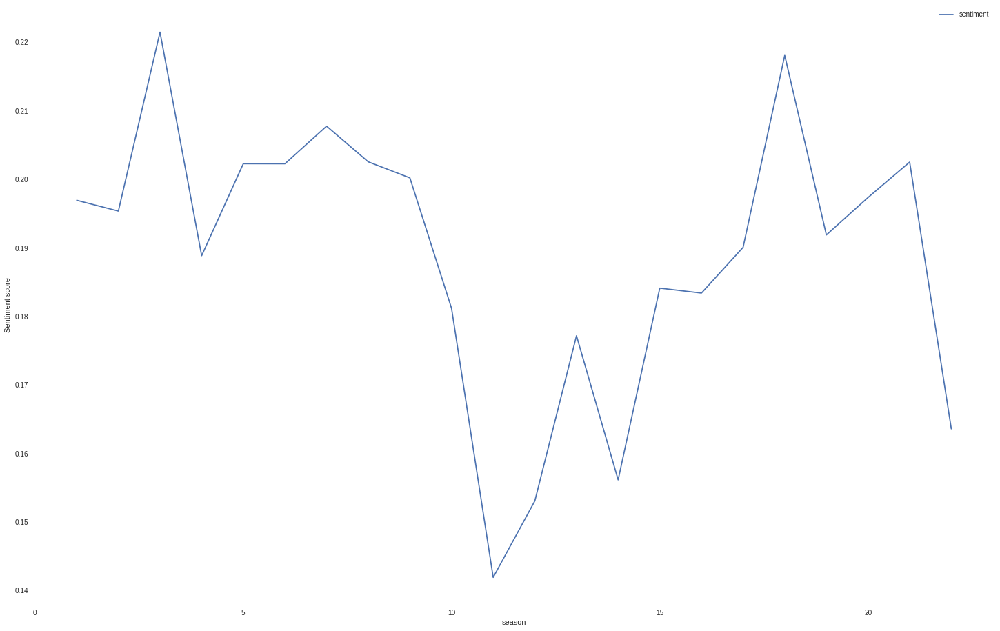

In [0]:
df_seasons_sentiment["season_number"] = df_seasons_sentiment.index
df_graph_sentiment = pd.DataFrame()
df_graph_sentiment['season'] = df_seasons_sentiment["season_number"]+1
df_graph_sentiment['sentiment'] = df_seasons_sentiment["sentiment"]

df_graph_sentiment = df_graph_sentiment.sort_values(by = "season")
df_graph_sentiment.plot(x='season', y='sentiment')
plt.ylabel("Sentiment score")
plt.rcParams['axes.facecolor'] = 'white'
plt.show()

### Conclusion
It turns out the most positive seasons are around the beginning and the latest seasons, with the middle being the most negative seasons. Season 22 is an outlier in this, but this could be due to this season only having a few episodes out at the time of writing, and as such has less time to normalize the sentiment like the other seasons.

Relating this to the real world, the most negative years would be between seasons 10 and 15, which would correspond to the timeframe 2006-2011. The most negative season is season 11, which aired in 2007. This season contained many episodes with crude subject matters, such as the episode where the boys pretend that they have tourettes syndrome. This adds up to a South Park that is not afraid to use more unconvetional language for comedic effect, and is regarded as one of the best seasons in all of South Park.

# Analysis 5 - TF-IDF (Characters) 


Now that we've looked at sentiment for both characters and the show as a whole, we wanted to look at what the unique words for the characters to try to see if we could figure out if certain characters have catch phrases. We do this by applying the TF-IDF algorithm, which calculates the Term Frequency (how often a word appears in the text) in relation to the Inverse Document Frequency (how many texts the word appears in). 

### Stemming

In order to look at TF-IDF, we must first stem the words in the script to get their base form. This allows us to have all variations of a word count as the same word, and such give a better result. As we have already removed stopwords during the sentiment analysis, doing so now is unnecessary

In [0]:
df_characters["script_stemmed"] = ""

In [0]:
df_characters['script_stemmed'] = df_characters['script'].apply(lambda x: [PorterStemmer().stem(item.lower()) for item in x])

### Compute TF-IDF for each document

Now we can simply compute TF-IDF for each document in the dataframe, which corresponds to each of the characters

In [0]:
import collections
import operator
import math

In [0]:
def compute_tf(list_of_words):
  count = collections.Counter(list_of_words) 
  dict_tf = {}
  for word in count.most_common():
    dict_tf[word[0]] = float(word[1])/len(list_of_words)
    
  return dict_tf

In [0]:
def collect_words(collected_scripts):
  dict_words = {}
  seen_words = []
  for script in collected_scripts:
    for word in script:
      if word in seen_words:
        continue
      if word in dict_words:
        dict_words[word] += 1
      else:
        dict_words[word] = 1
      seen_words.append(word)
    seen_words = []
  return dict_words

In [0]:
def compute_idf(collected_scripts):
  dict_idf = {}
  dict_words = collect_words(collected_scripts)
  for i in dict_words:
    dict_idf[i] = math.log(len(collected_scripts)/dict_words[i], 10) 
    
  return dict_idf

In [0]:
def compute_tf_idf(dict_tf, dict_idf):
  dict_tf_idf = {}
  for word in dict_idf:
    if not dict_tf.get(word) == None:
      dict_tf_idf[word] = dict_tf[word] * dict_idf[word]
  return dict_tf_idf

In [0]:
df_characters["tf"] = 0
#for i in range(len(df_seasons["script_stemmed"])):
df_characters["tf"] = df_characters["script_stemmed"].apply(lambda x: compute_tf(x))
characters_scripts = df_characters["script_stemmed"]
dict_idf = compute_idf(characters_scripts)

df_characters["tf_idf"] = 0
df_characters["tf_idf"] = df_characters["tf"].apply(lambda x: compute_tf_idf(x ,dict_idf))

## Word Cloud

In order to get a better overview of the results, we convert the TF-IDF results into wordclouds. As the four main characters are the most interesting to look at, we decided to only create wordclouds for these.

In [0]:
def generate_tf_idf_wordlist(dict_tf_idf):
    words = sorted(dict_tf_idf.items(), key=operator.itemgetter(1))[-100:]
    total = 0
    word_list = []
    for w in words:
        total += w[1]
    for w in words:
        amount = round(w[1]/total*1000)
        for i in range(amount):
            word_list.append(w[0])
    return word_list

In [0]:
!pip install wordcloud

In [0]:
from os import path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

def google_authenticate():
  # Authenticate first so the Google Drive library can detect your credentials.
  from google.colab import auth
  auth.authenticate_user()

  from googleapiclient.discovery import build
  drive_service = build('drive', 'v3')
  return drive_service

In [0]:
drive_service = google_authenticate()
document = generate_tf_idf_wordlist(df_characters["tf_idf"][df_characters[df_characters.Name == "Kyle Broflovski"].index[0]])
document = " ".join(str(x) for x in document)
document2 = generate_tf_idf_wordlist(df_characters["tf_idf"][df_characters[df_characters.Name == "Stan Marsh"].index[0]])
document2 = " ".join(str(x) for x in document2)
document3 = generate_tf_idf_wordlist(df_characters["tf_idf"][df_characters[df_characters.Name == "Kenny McCormick"].index[0]])
document3 = " ".join(str(x) for x in document3)
document4 = generate_tf_idf_wordlist(df_characters["tf_idf"][df_characters[df_characters.Name == "Eric Cartman"].index[0]])
document4 = " ".join(str(x) for x in document4)

#import image
image_file_kyle = open("drive/"+path_collab +'/kyle.jpg','rb')
image_file_stan = open("drive/"+path_collab +'/stan.jpg','rb')
image_file_cartman = open("drive/"+path_collab +'/cartman.jpg','rb')
image_file_kenny = open("drive/"+path_collab +'/kenny.jpg','rb')

# create mask
kyle_mask = np.array(Image.open(image_file_kyle))
stan_mask = np.array(Image.open(image_file_stan))
cartman_mask = np.array(Image.open(image_file_cartman))
kenny_mask = np.array(Image.open(image_file_kenny))

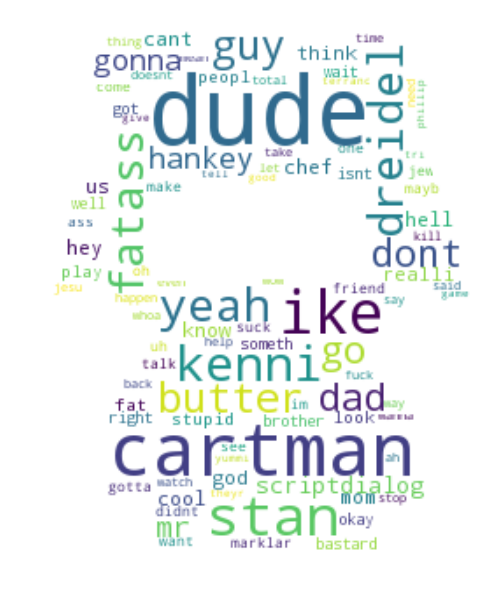

In [0]:
# generate word cloud Kyle
wc = WordCloud(background_color="white", max_words=2000, mask=kyle_mask, collocations = False)
wc.generate(document)

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

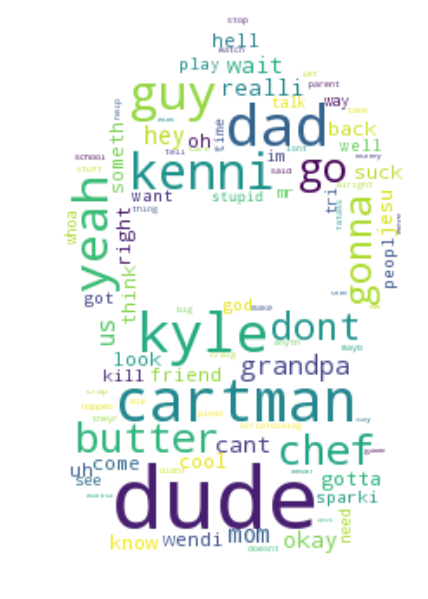

In [0]:
# generate word cloud Stan
wc = WordCloud(background_color="white", max_words=2000, mask=stan_mask, collocations = False)
wc.generate(document2)

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

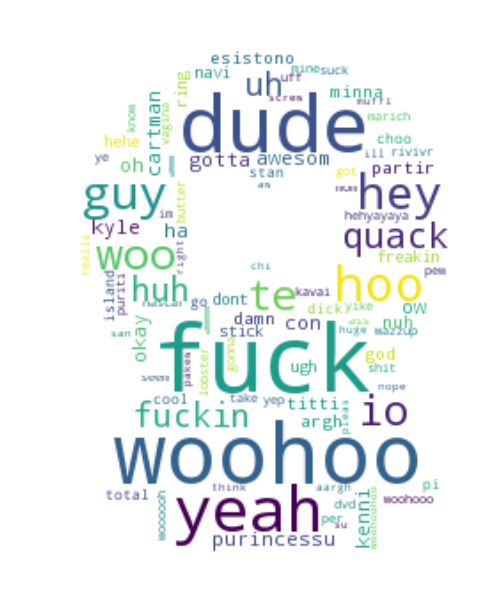

In [0]:
# generate word cloud Kenny
wc = WordCloud(background_color="white", max_words=2000, mask=kenny_mask, collocations = False)
wc.generate(document3)

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

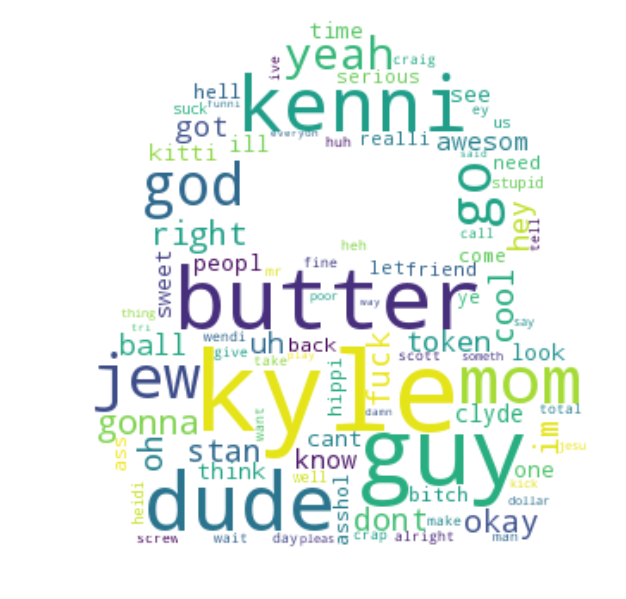

In [0]:
# generate word cloud Cartman
wc = WordCloud(background_color="white", max_words=2000, mask=cartman_mask, collocations = False)
wc.generate(document4)

# plot the word cloud
plt.figure(figsize=(8,6), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

### Conclusion
In conclusion, we can see that Kyle has a unique word in Fatass, which is how he refers to Eric Cartman. Stan has words that relate to his family, with Dad and Grandpa. Kenny has a lot of exclamations with Woohoo, but also is the predominant user of the word Fuck. Cartman refers to Kyle and Butters a lot, but also talks a lot about jews and his Mom.

# Analysis 6 - TF-IDF (Seasons)

Now we will do TF-IDF again, but for the seasons this time.

### Stemming

We once again stem the words, keeping in mind that we already removed stopwords when doing the sentiment analysis

In [0]:
df_seasons["script_stemmed"] = ""

In [0]:
df_seasons['script_stemmed'] = df_seasons['script'].apply(lambda x: [PorterStemmer().stem(item.lower()) for item in x])

### Compute TF-IDF for each document

We compute the TF-IDF scores per season

In [0]:
import collections
import operator
import math

In [0]:
def compute_tf(list_of_words):
  count = collections.Counter(list_of_words) 
  dict_tf = {}
  for word in count.most_common():
    dict_tf[word[0]] = float(word[1])/len(list_of_words)
    
  return dict_tf

In [0]:
def collect_words(collected_scripts):
  dict_words = {}
  seen_words = []
  for script in collected_scripts:
    for word in script:
      if word in seen_words:
        continue
      if word in dict_words:
        dict_words[word] += 1
      else:
        dict_words[word] = 1
      seen_words.append(word)
    seen_words = []
  return dict_words

In [0]:
def compute_idf(collected_scripts):
  dict_idf = {}
  dict_words = collect_words(collected_scripts)
  for i in dict_words:
    dict_idf[i] = math.log(len(collected_scripts)/dict_words[i], 10) 
    
  return dict_idf

In [0]:
def compute_tf_idf(dict_tf, dict_idf):
  dict_tf_idf = {}
  for word in dict_idf:
    if not dict_tf.get(word) == None:
      dict_tf_idf[word] = dict_tf[word] * dict_idf[word]
  return dict_tf_idf

In [0]:
df_seasons["tf"] = 0
#for i in range(len(df_seasons["script_stemmed"])):
df_seasons["tf"] = df_seasons["script_stemmed"].apply(lambda x: compute_tf(x))
seasons_scripts = df_seasons["script_stemmed"]
dict_idf = compute_idf(seasons_scripts)

df_seasons["tf_idf"] = 0
df_seasons["tf_idf"] = df_seasons["tf"].apply(lambda x: compute_tf_idf(x ,dict_idf))

### Wordcloud

We visualize the results using wordclouds

In [0]:
def generate_tf_idf_wordlist(dict_tf_idf):
    words = sorted(dict_tf_idf.items(), key=operator.itemgetter(1))[-100:]
    total = 0
    word_list = []
    for w in words:
        total += w[1]
    for w in words:
        amount = round(w[1]/total*1000)
        for i in range(amount):
            word_list.append(w[0])
    return word_list

In [0]:
!pip install wordcloud

Season One


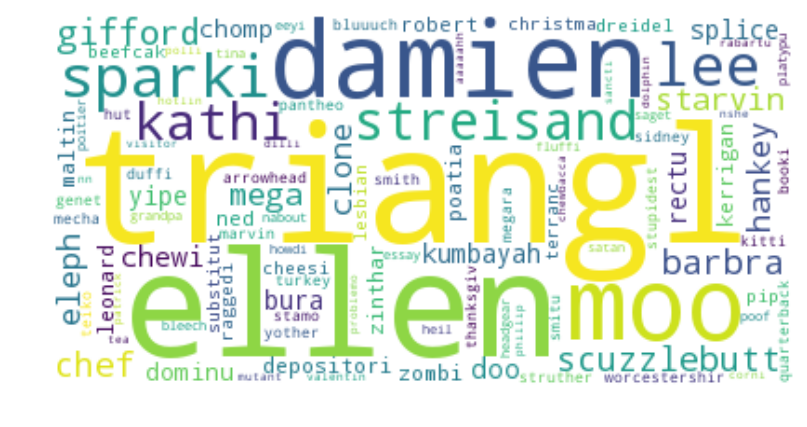

Season Two


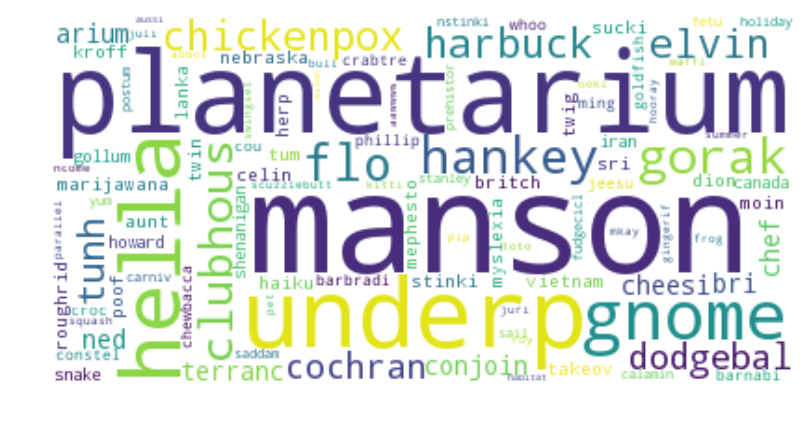

Season Three


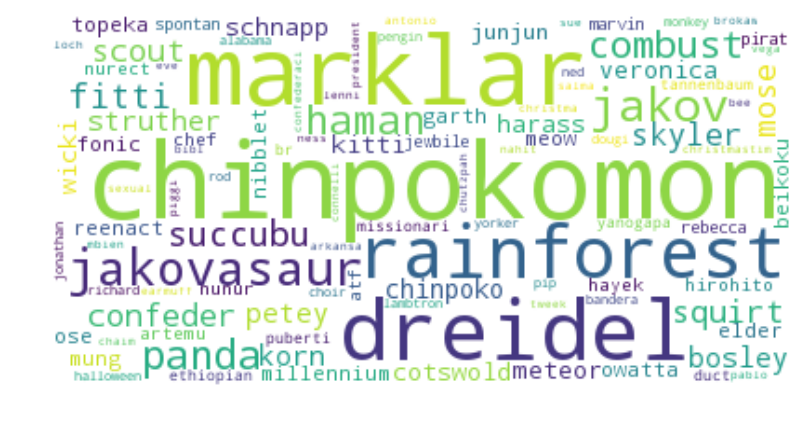

Season Four


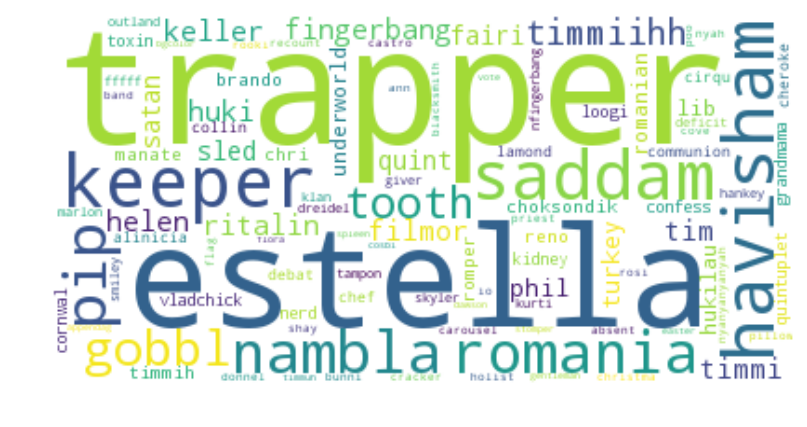

Season Five


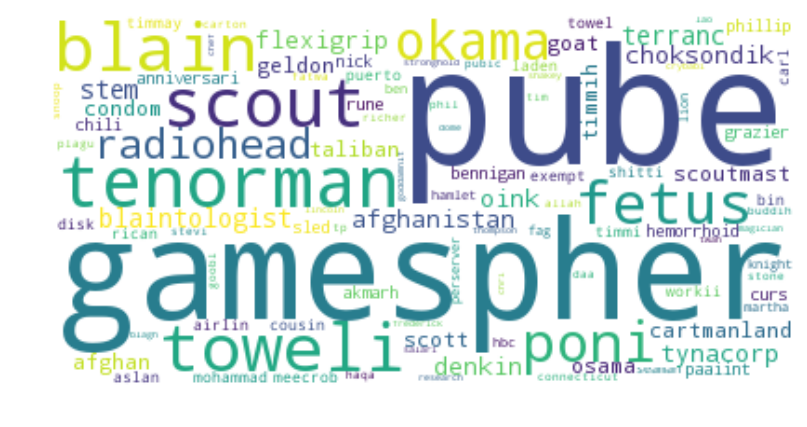

Season Six


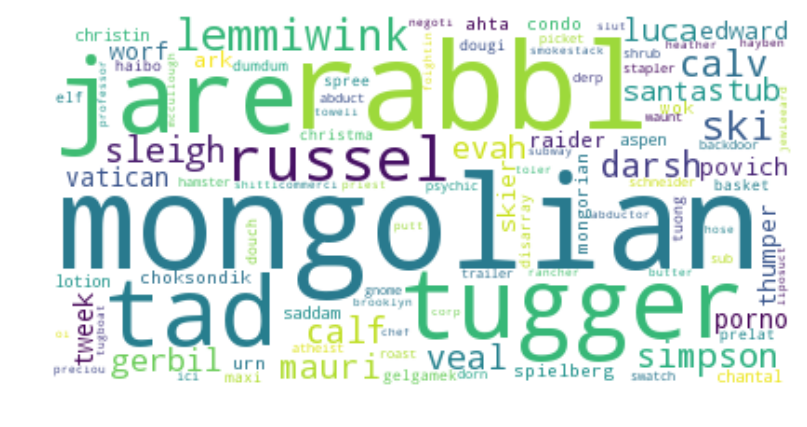

Season Seven


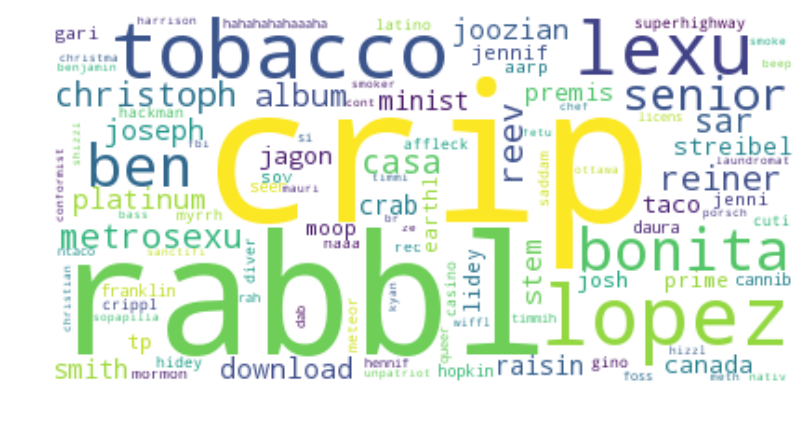

Season Eight


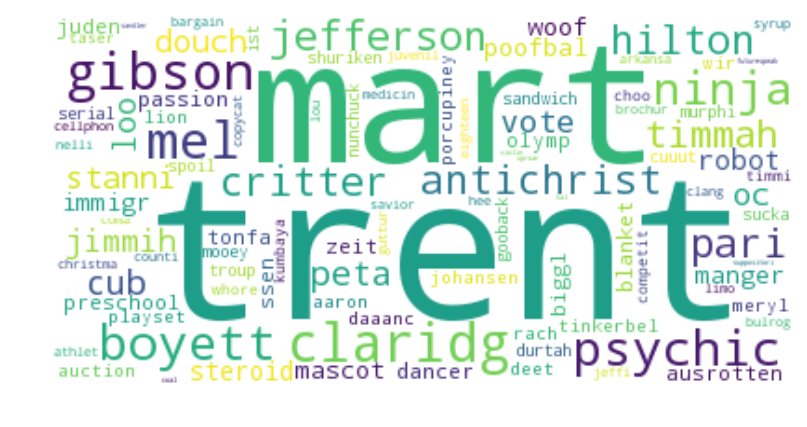

Season Nine


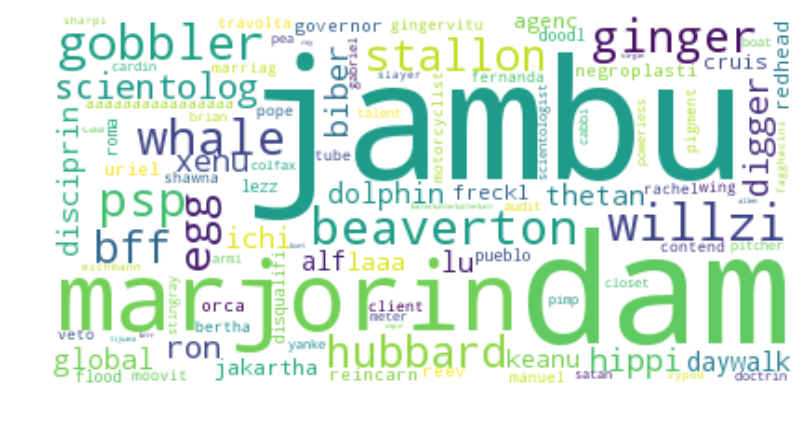

Season Ten


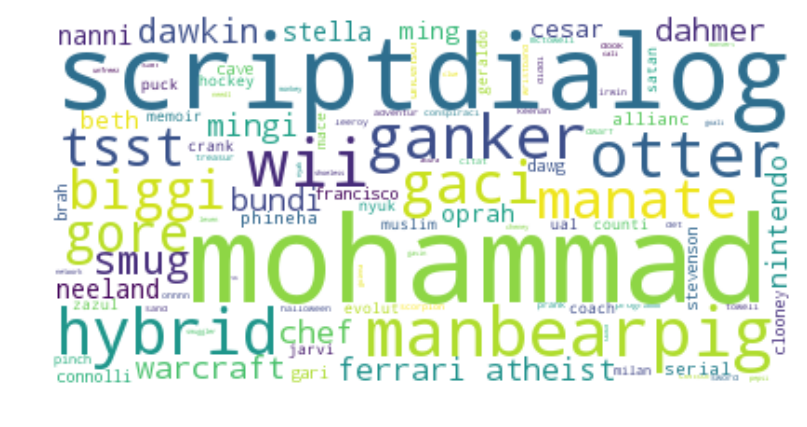

Season Eleven


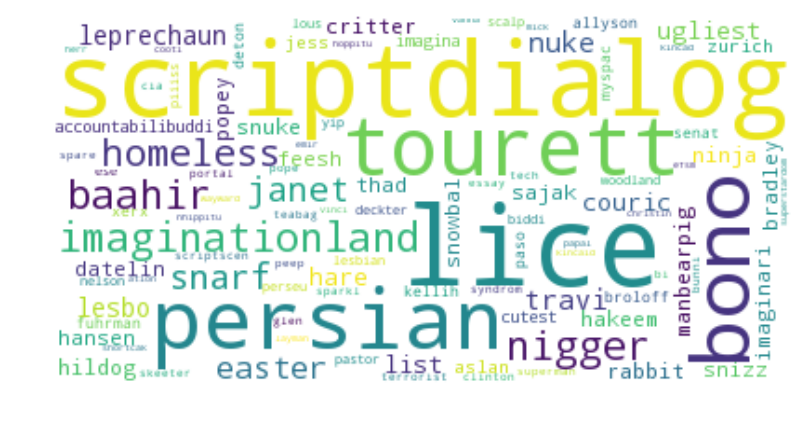

Season Twelve


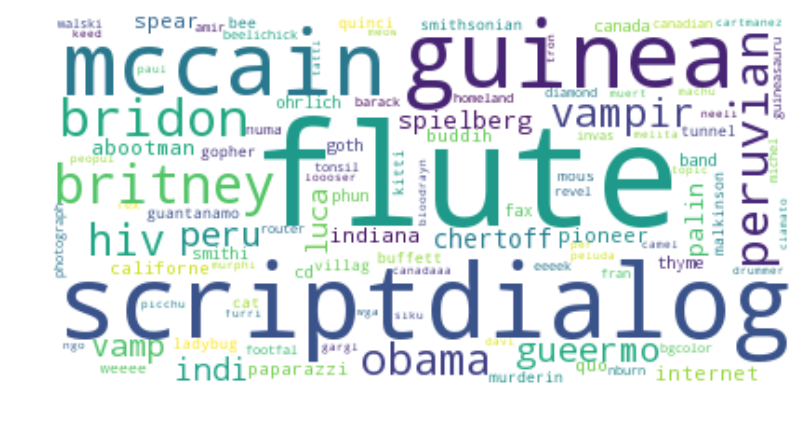

Season Thirteen


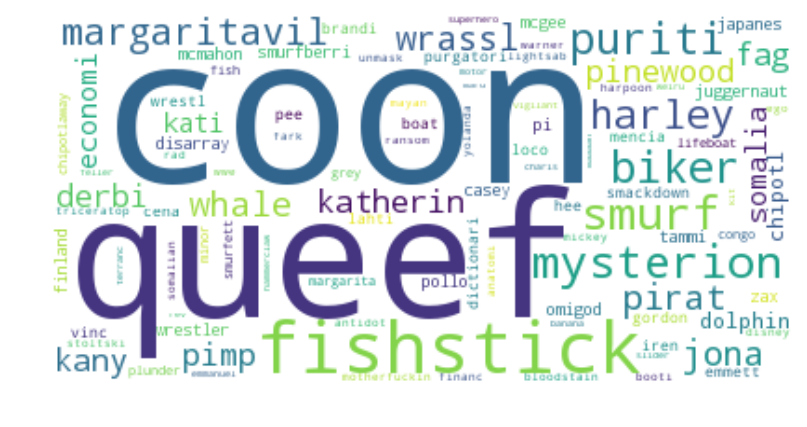

Season Fourteen


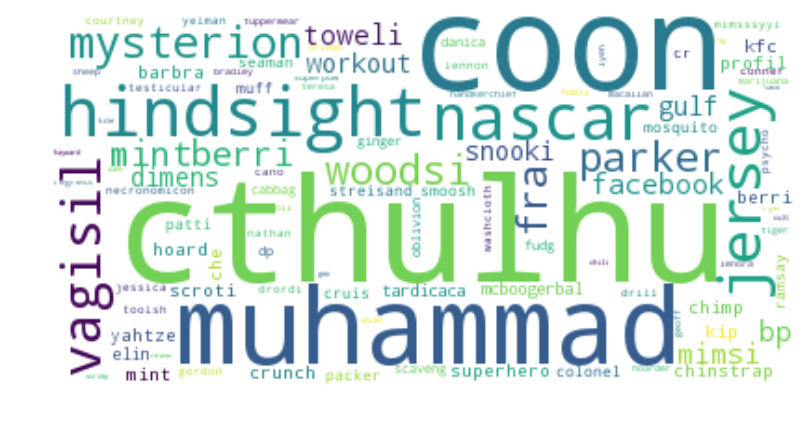

Season Fifteen


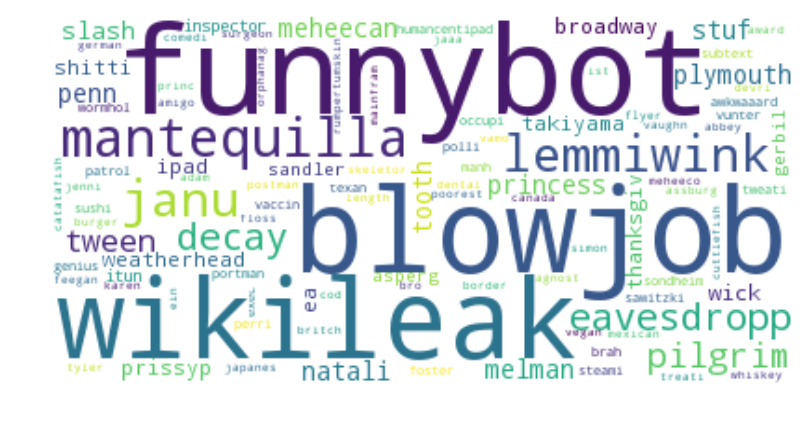

Season Sixteen


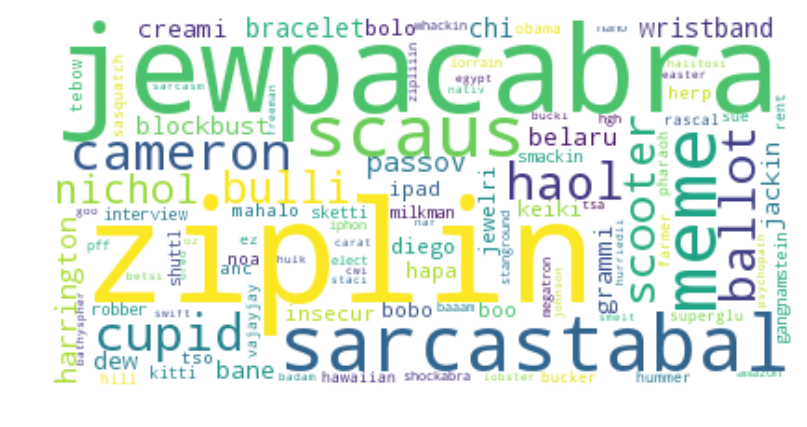

Season Seventeen


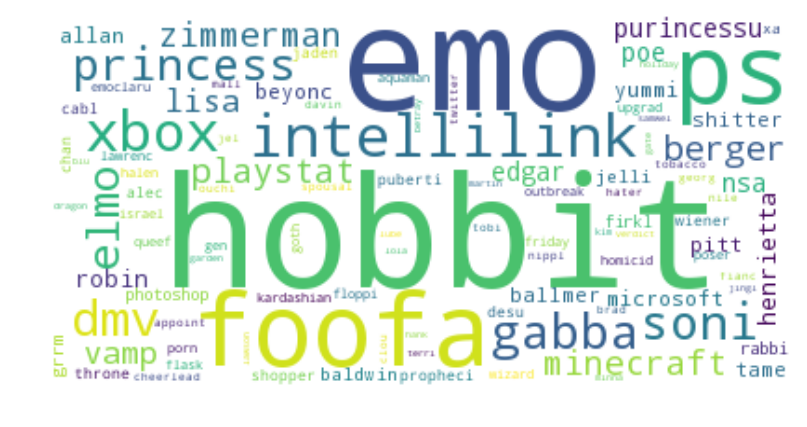

Season Eighteen


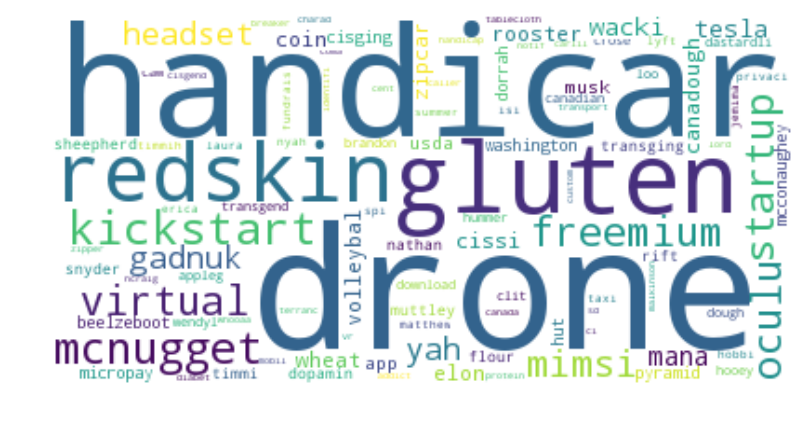

Season Nineteen


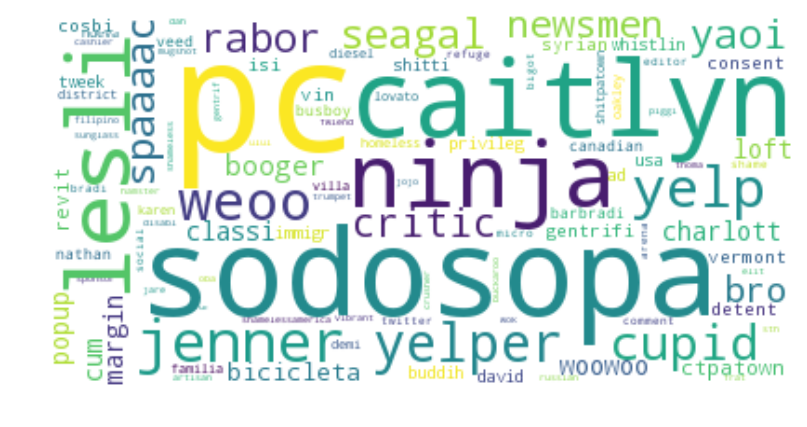

Season Twenty


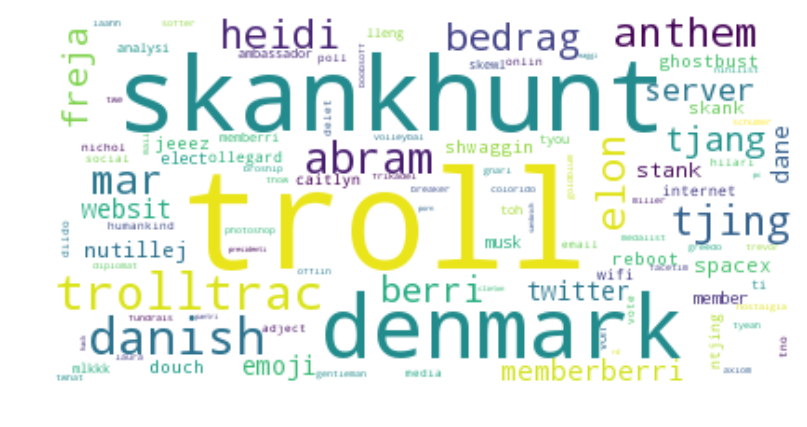

Season Twenty-One


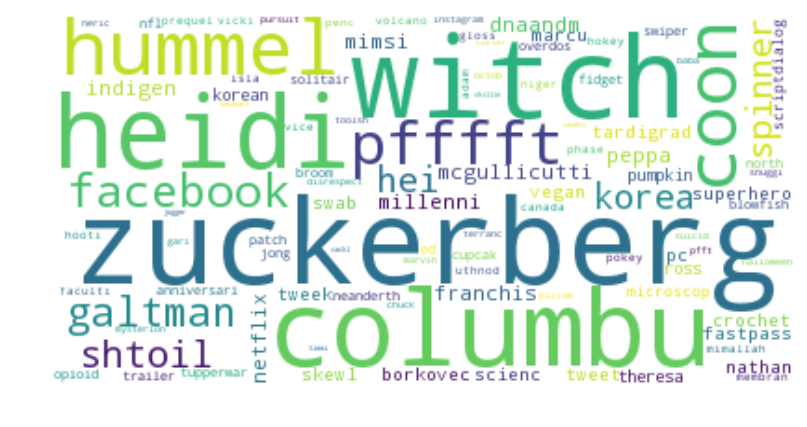

Season Twenty-Two


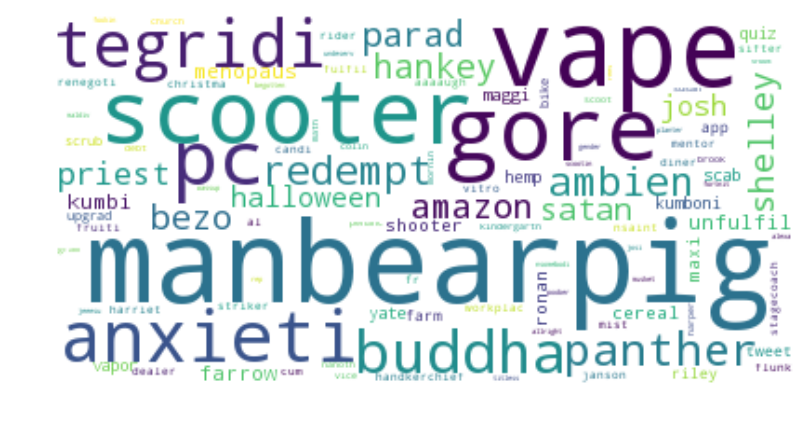

In [0]:
for s in seasons:
  # generate word cloud Season One
  print(s)
  document = generate_tf_idf_wordlist(df_seasons["tf_idf"][df_seasons[df_seasons.season == s].index[0]])
  document = " ".join(str(x) for x in document)
  wc = WordCloud(background_color="white", max_words=2000, collocations = False)
  wc.generate(document)

  # plot the word cloud
  plt.figure(figsize=(8,6), dpi=120)
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.show()

### Conclusion
We can see unique words throughout the seasons that correspond well with what was going on in the world at the time. Around the beginning we can se Manson, referring to Marilyn Manson who was controversial at the time. Later on we see Saddam Hussein appearing, right around when the conflict in Iraq was flaring up. This leads to season 9 where we see the famous Scientology episode dominating the wordcloud. Season 10 we have the Mohammad conflict, which was just after the Muhammad drawing by Jyllands Posten in Denmark, among others. In Season Fifteen we see Wikileaks in the wordcloud, which appeared when South Park did their parody of Julian Assange. In season 18 we start seeing Gluten, Freemium, Drone and Kickstart - all topics that quickly grew in popularity around when the season aired in 2014. Season 19 started with the rise of PC (politically correct) culture, and the massive gentrification movements that took place around the world, which of course was reflected in South Park.  This all culminates in Season 22, which is currently airing, with words such as Vape, Anxiety and Amazon appearing, Amazon being especially notable as their poor working conditions have been appearing in the news lately.